In [70]:
import seaborn as sns

In [71]:
import mne
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import kurtosis
import scipy
from scipy import stats
import numpy as np
import IPython.display as ipd
import scipy as sp
import networkx as nx

In [72]:
def read_data(file_path):
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
  content = content.drop_channels(["T","X","Y",'Pz','P8','Oz'])
  print(content.ch_names)
  return content



In [73]:
example = read_data("/home/rucha/Desktop/Fatigue-main/setfiles/subject_1.set")

Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_1.fdt
Reading 0 ... 23088  =      0.000 ...    90.188 secs...
['Fp1', 'Fp2', 'FC5', 'FC6', 'Fz', 'T7', 'Cz', 'T8', 'P3', 'O1']


/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: Data file name in EEG.data (sub1.fdt) is incorrect, the file name must have changed on disk, using the correct file name (subject_1.fdt).
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: Limited 4 annotation(s) that were expanding outside the data range.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)


In [74]:
from glob import glob
# all_file_path=glob("/content/drive/MyDrive/preprocessed/*.set")
all_file_path=glob("/home/rucha/Desktop/Fatigue-main/setfiles/*.set")
print(all_file_path)
# raw = read_data("/content/drive/MyDrive/setfiles/subject_1.set")
# raw=raw.drop_channels(["T","X","Y"])
# print(raw.info)
# raw.plot()
# raw_df = raw.to_data_frame()
# raw_df
# raw.info



['/home/rucha/Desktop/Fatigue-main/setfiles/subject_8.set', '/home/rucha/Desktop/Fatigue-main/setfiles/subject_7.set', '/home/rucha/Desktop/Fatigue-main/setfiles/subject_20.set', '/home/rucha/Desktop/Fatigue-main/setfiles/subject_18.set', '/home/rucha/Desktop/Fatigue-main/setfiles/subject_3.set', '/home/rucha/Desktop/Fatigue-main/setfiles/subject_6.set', '/home/rucha/Desktop/Fatigue-main/setfiles/subject_14.set', '/home/rucha/Desktop/Fatigue-main/setfiles/subject_19.set', '/home/rucha/Desktop/Fatigue-main/setfiles/subject_13.set', '/home/rucha/Desktop/Fatigue-main/setfiles/subject_4.set', '/home/rucha/Desktop/Fatigue-main/setfiles/subject_2.set', '/home/rucha/Desktop/Fatigue-main/setfiles/subject_11.set', '/home/rucha/Desktop/Fatigue-main/setfiles/subject_16.set', '/home/rucha/Desktop/Fatigue-main/setfiles/subject_15.set', '/home/rucha/Desktop/Fatigue-main/setfiles/subject_10.set', '/home/rucha/Desktop/Fatigue-main/setfiles/subject_17.set', '/home/rucha/Desktop/Fatigue-main/setfiles/su

In [75]:
sample_data=[read_data(i) for i in all_file_path]
#data=read_data("/content/drive/MyDrive/preprocessed/sub0.set")
# content=mne.io.read_raw_eeglab("/content/drive/MyDrive/preprocessed/sub0.set", eog=(), preload=True)
# data=content.get_data()
print(len(sample_data))


Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_8.fdt
Reading 0 ... 29113  =      0.000 ...   113.723 secs...


/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: Data file name in EEG.data (sub8.fdt) is incorrect, the file name must have changed on disk, using the correct file name (subject_8.fdt).
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)


['Fp1', 'Fp2', 'FC5', 'FC6', 'T7', 'Cz', 'T8', 'P7', 'P3', 'P4', 'O1', 'O2']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_7.fdt
Reading 0 ... 31080  =      0.000 ...   121.406 secs...
['Fp1', 'Fp2', 'FC5', 'Fz', 'T7', 'Cz', 'T8', 'P3', 'P4', 'O1', 'O2']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_20.fdt
Reading 0 ... 19168  =      0.000 ...    74.875 secs...
['Fp1', 'Fp2', 'FC5', 'Fz', 'T7', 'Cz', 'T8', 'P7', 'O1']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_18.fdt
Reading 0 ... 31293  =      0.000 ...   122.238 secs...
['Fp1', 'Fp2', 'FC5', 'FC6', 'Fz', 'T7', 'Cz', 'P7', 'P3', 'P4', 'O1', 'O2']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_3.fdt
Reading 0 ... 18544  =      0.000 ...    72.438 secs...
['Fp1', 'Fp2', 'FC5', 'FC6', 'Fz', 'T7', 'Cz', 'T8', 'P3', 'P4', 'O1', 'O2']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_6.fdt
Reading 0 ... 16575  =      0.000 ...    64.746 secs...
['Fp1', 'Fp2', 'FC5', 'FC6', 'Fz', 'T7'

/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: Data file name in EEG.data (sub0.fdt) is incorrect, the file name must have changed on disk, using the correct file name (subject_7.fdt).
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: Limited 2 annotation(s) that were expanding outside the data range.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: Th

Reading 0 ... 19858  =      0.000 ...    77.570 secs...
['Fp1', 'Fp2', 'FC5', 'FC6', 'Fz', 'T7', 'Cz', 'T8', 'P7', 'P3', 'P4', 'O1', 'O2']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_19.fdt
Reading 0 ... 30211  =      0.000 ...   118.012 secs...
['Fp2', 'FC5', 'Fz', 'T7', 'Cz', 'T8', 'P7', 'P3', 'P4', 'O1', 'O2']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_13.fdt
Reading 0 ... 20253  =      0.000 ...    79.113 secs...
['Fp1', 'Fp2', 'FC5', 'Fz', 'T7', 'Cz', 'T8', 'P7', 'P3', 'P4', 'O1']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_4.fdt
Reading 0 ... 31627  =      0.000 ...   123.543 secs...
['Fp1', 'Fp2', 'FC5', 'Fz', 'T7', 'Cz', 'T8', 'P7', 'P3', 'P4', 'O1']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_2.fdt
Reading 0 ... 27489  =      0.000 ...   107.379 secs...
['Fp2', 'FC5', 'Fz', 'T7', 'Cz', 'T8', 'P7', 'P3', 'P4', 'O1', 'O2']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_11.fdt
Reading 0 ... 5949  =      0.000 ...

/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: Data file n

['Fp2', 'Fz', 'T7', 'Cz', 'T8', 'P7', 'P3', 'P4', 'O1']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_15.fdt
Reading 0 ... 12110  =      0.000 ...    47.305 secs...
['Fp1', 'Fp2', 'FC5', 'FC6', 'Fz', 'T7', 'Cz', 'P7', 'P3', 'P4', 'O1']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_10.fdt
Reading 0 ... 19697  =      0.000 ...    76.941 secs...
['Fp1', 'Fp2', 'FC5', 'FC6', 'Fz', 'T7', 'Cz', 'P7', 'P3', 'P4', 'O1', 'O2']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_17.fdt
Reading 0 ... 16941  =      0.000 ...    66.176 secs...
['Fp1', 'Fp2', 'FC5', 'FC6', 'Fz', 'T7', 'Cz', 'T8', 'P7', 'P3', 'P4', 'O1', 'O2']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_1.fdt
Reading 0 ... 23088  =      0.000 ...    90.188 secs...
['Fp1', 'Fp2', 'FC5', 'FC6', 'Fz', 'T7', 'Cz', 'T8', 'P3', 'O1']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_5.fdt
Reading 0 ... 35819  =      0.000 ...   139.918 secs...
['Fp1', 'Fp2', 'FC5', 'FC6', 'Fz', 'T7', 'Cz'

/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: Limited 6 annotation(s) that were expanding outside the data range.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: Data file name in EEG.data (sub10.fdt) is incorrect, the file name must 

['Fp1', 'Fp2', 'FC5', 'Fz', 'T7', 'Cz', 'T8', 'P7', 'P3', 'P4']
Reading /home/rucha/Desktop/Fatigue-main/setfiles/subject_12.fdt
Reading 0 ... 19133  =      0.000 ...    74.738 secs...
['Fp1', 'Fp2', 'FC5', 'FC6', 'Fz', 'T7', 'Cz', 'T8', 'P7', 'P3', 'P4', 'O1', 'O2']
20


/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: Limited 2 annotation(s) that were expanding outside the data range.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)
/tmp/ipykernel_27831/1687101746.py:2: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  content=mne.io.read_raw_eeglab(file_path, eog=(), preload=True)


Not setting metadata
227 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 227 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  226 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~5.3 MB, data loaded,
 '1': 226>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 12 channels (please be patient, this may take a while)
Selecting by number: 12 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 0.9s.


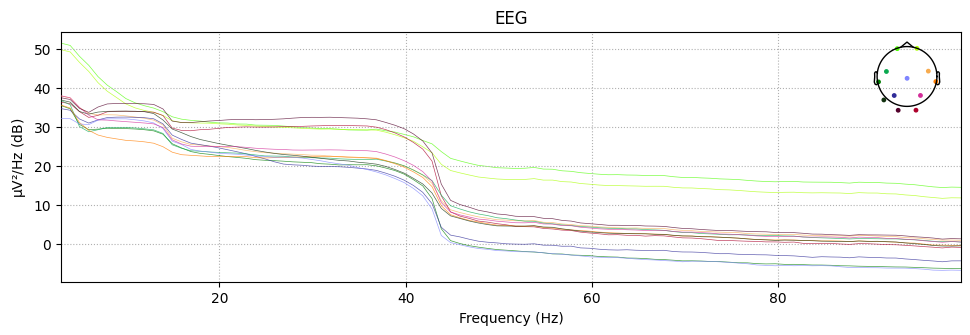

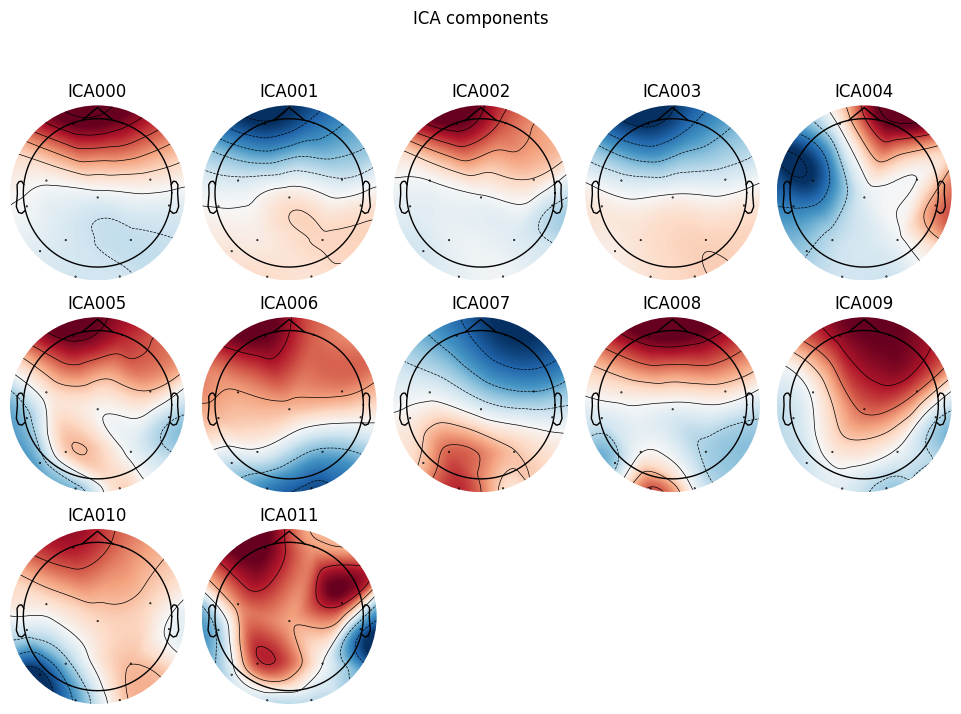

Not setting metadata
242 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 242 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  241 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~5.2 MB, data loaded,
 '1': 241>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 11 channels (please be patient, this may take a while)
Selecting by number: 11 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 9.7s.


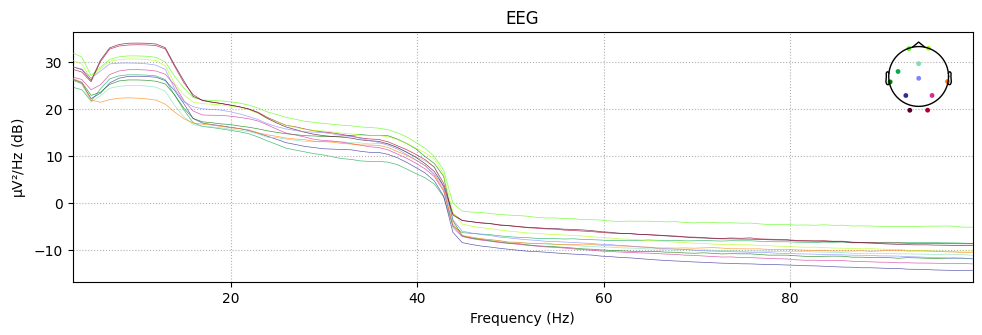

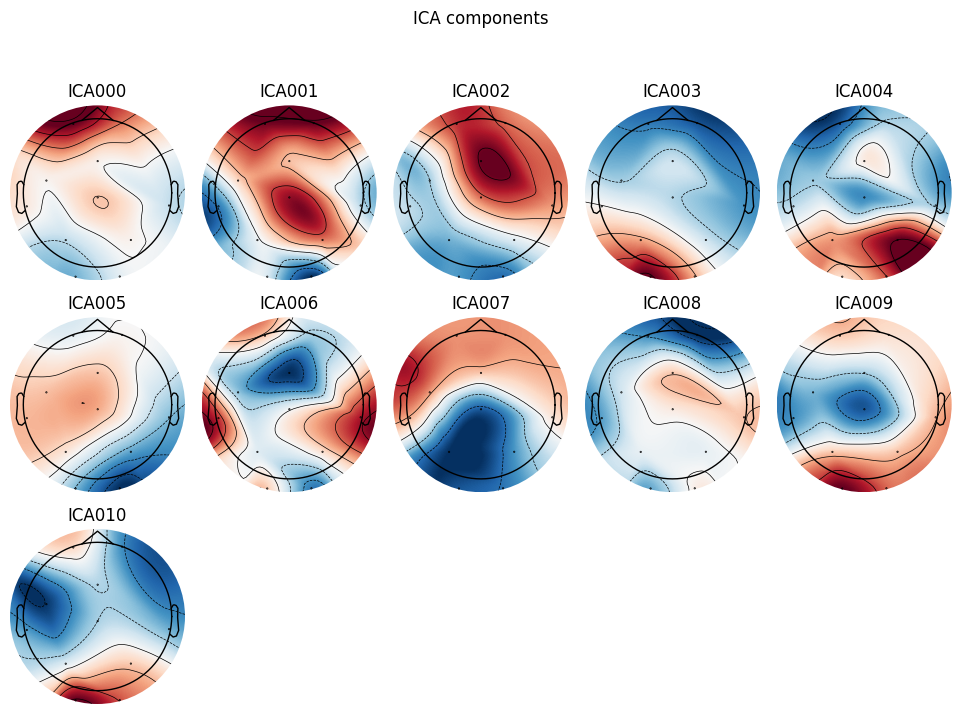

Not setting metadata
149 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 149 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  148 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~2.6 MB, data loaded,
 '1': 148>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 9 channels (please be patient, this may take a while)
Selecting by number: 9 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 0.4s.


/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: Using n_components=9 (resulting in n_components_=9) may lead to an unstable mixing matrix estimation because the ratio between the largest (7.2) and smallest (1.1e-15) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 5
  ica.fit(data)


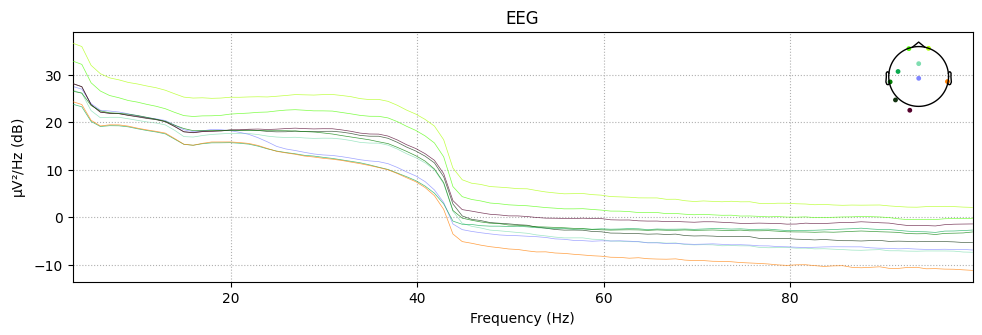

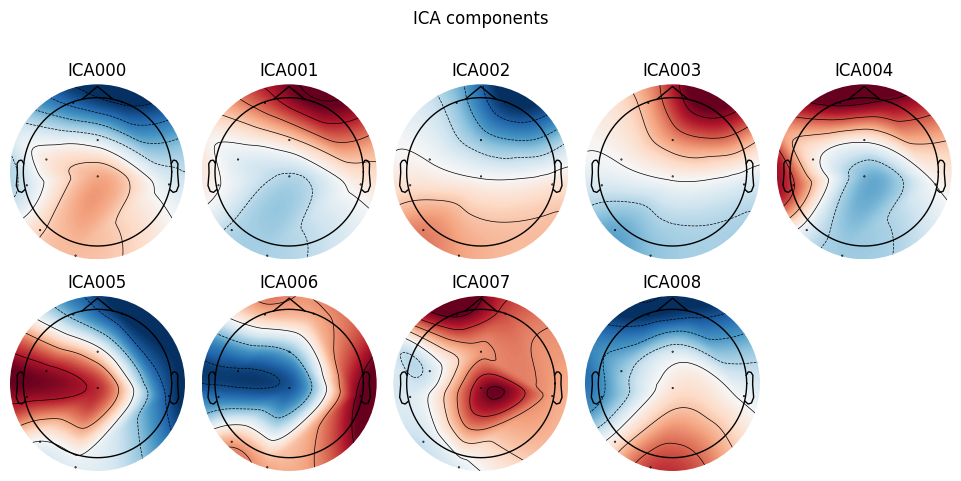

Not setting metadata
244 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 244 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  243 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~5.7 MB, data loaded,
 '1': 243>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 12 channels (please be patient, this may take a while)
Selecting by number: 12 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 1.6s.


/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (6.4) and smallest (1.9e-15) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 8
  ica.fit(data)


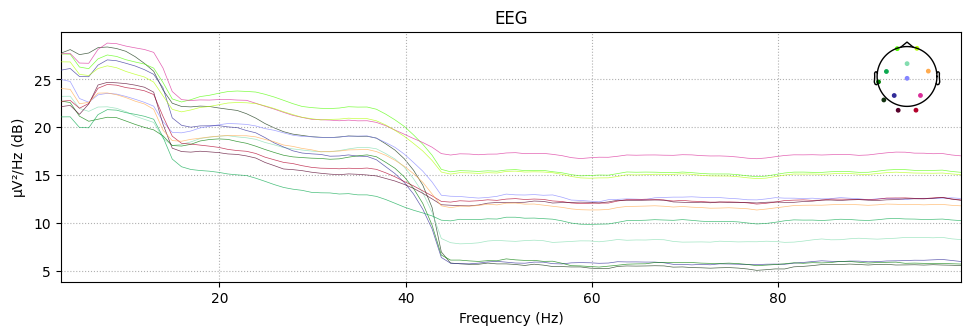

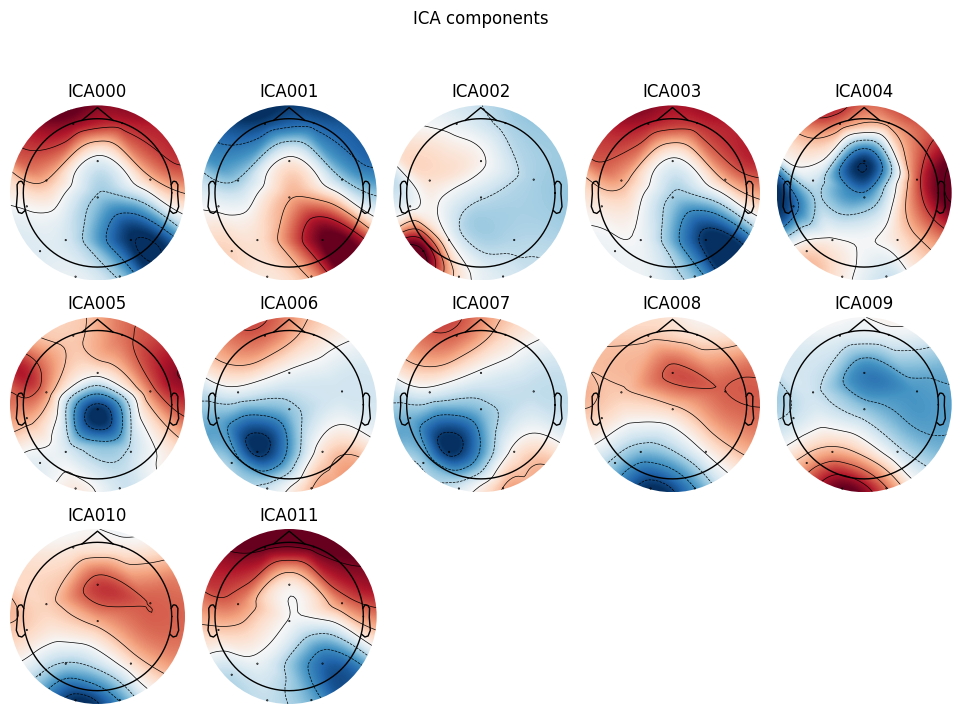

Not setting metadata
144 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 144 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  143 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~3.4 MB, data loaded,
 '1': 143>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 12 channels (please be patient, this may take a while)
Selecting by number: 12 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 1.2s.


/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (5.8) and smallest (1.3e-15) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(data)


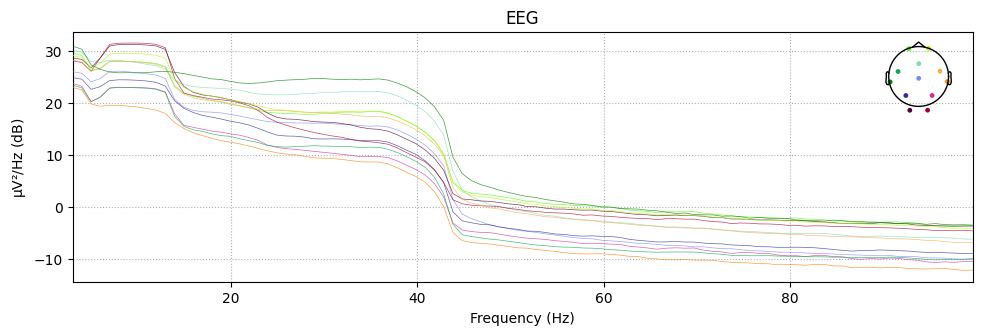

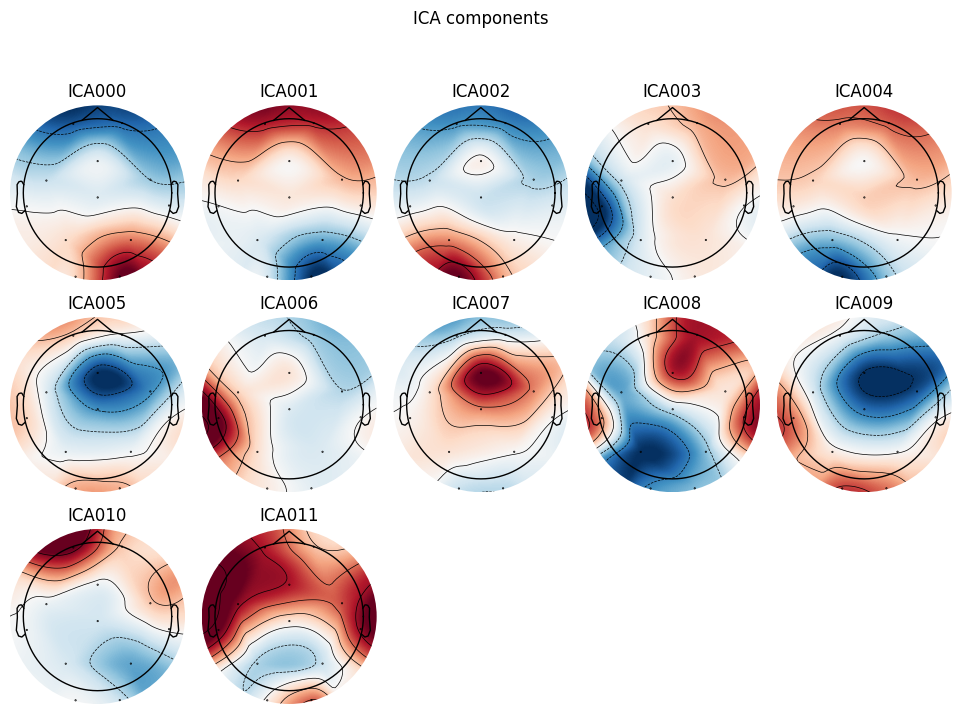

Not setting metadata
129 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 129 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  128 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~2.8 MB, data loaded,
 '1': 128>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 11 channels (please be patient, this may take a while)
Selecting by number: 11 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 0.6s.


/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: Using n_components=11 (resulting in n_components_=11) may lead to an unstable mixing matrix estimation because the ratio between the largest (7.8) and smallest (1.3e-15) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(data)


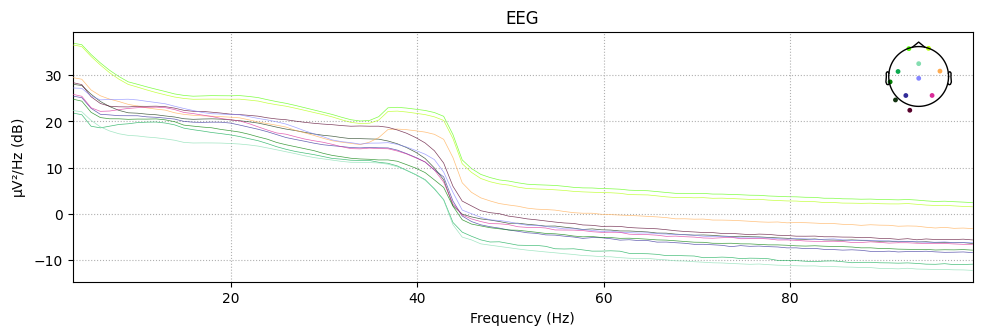

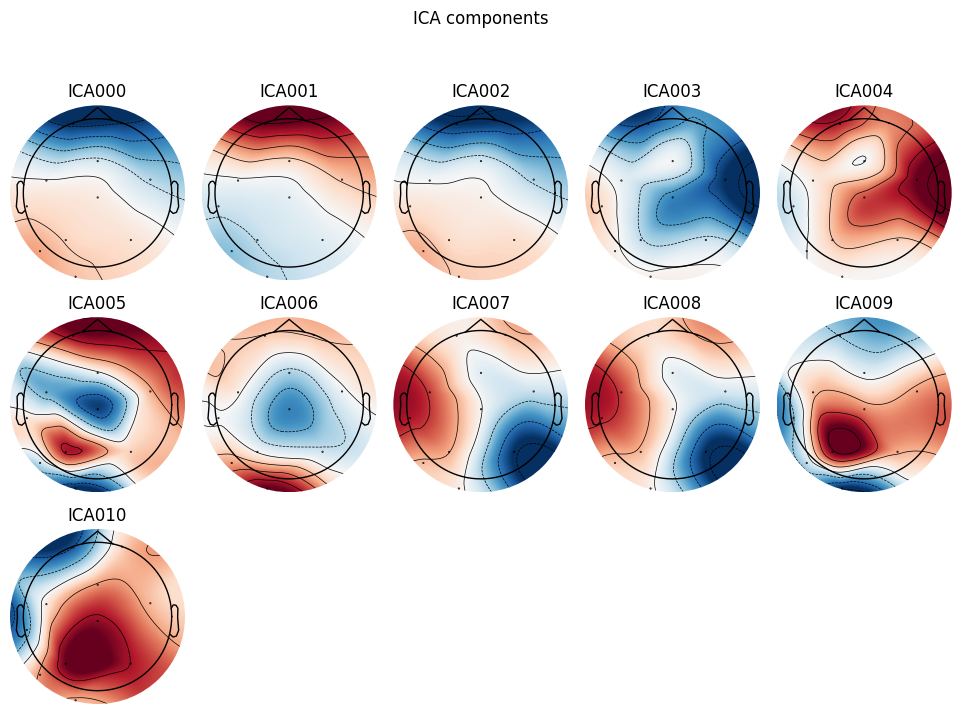

Not setting metadata
155 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 155 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  154 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~4.0 MB, data loaded,
 '1': 154>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 13 channels (please be patient, this may take a while)
Selecting by number: 13 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 10.2s.


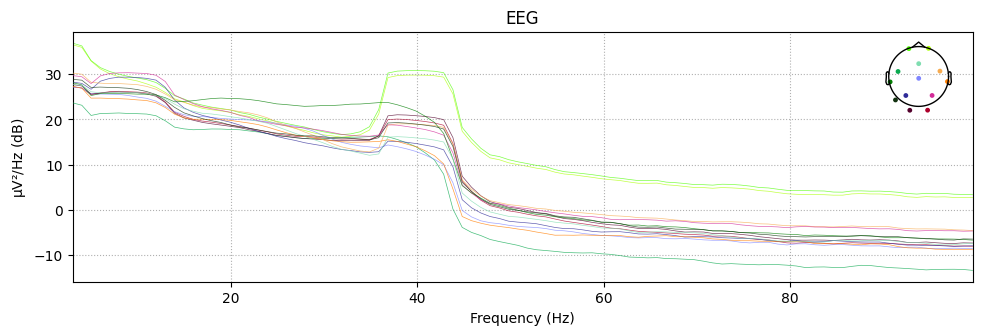

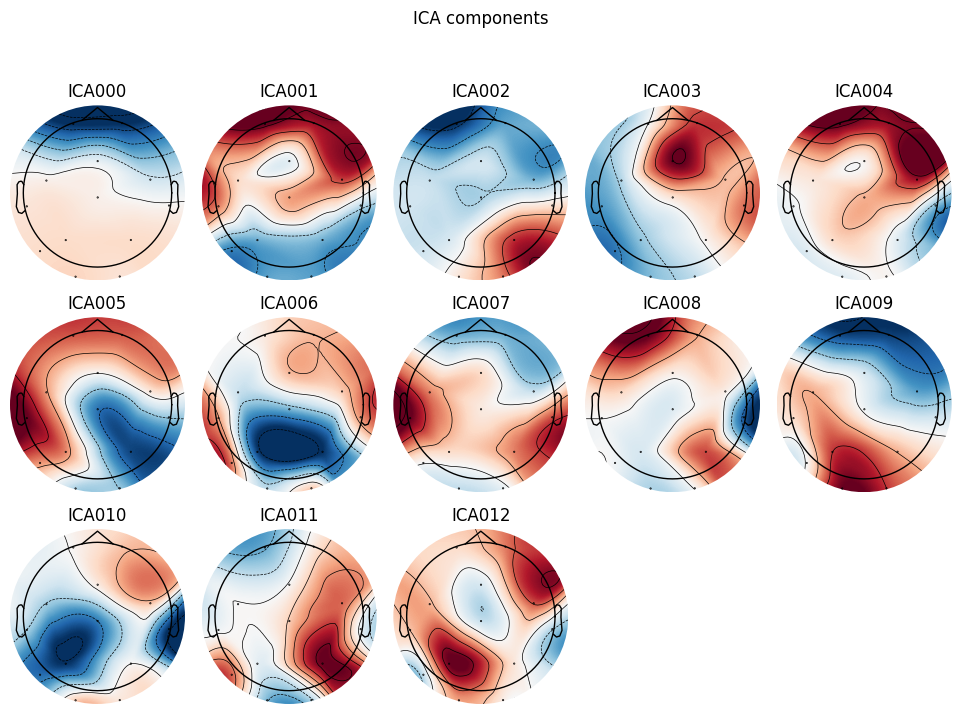

Not setting metadata
236 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 236 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  235 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~5.1 MB, data loaded,
 '1': 235>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 11 channels (please be patient, this may take a while)
Selecting by number: 11 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 1.0s.


/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: Using n_components=11 (resulting in n_components_=11) may lead to an unstable mixing matrix estimation because the ratio between the largest (7) and smallest (4.1e-16) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(data)


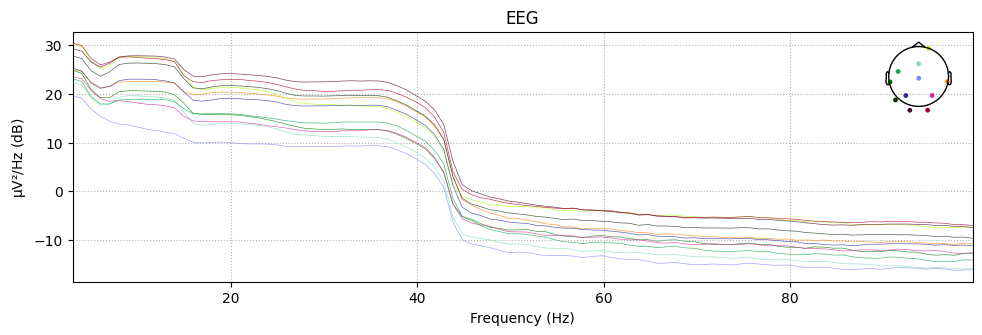

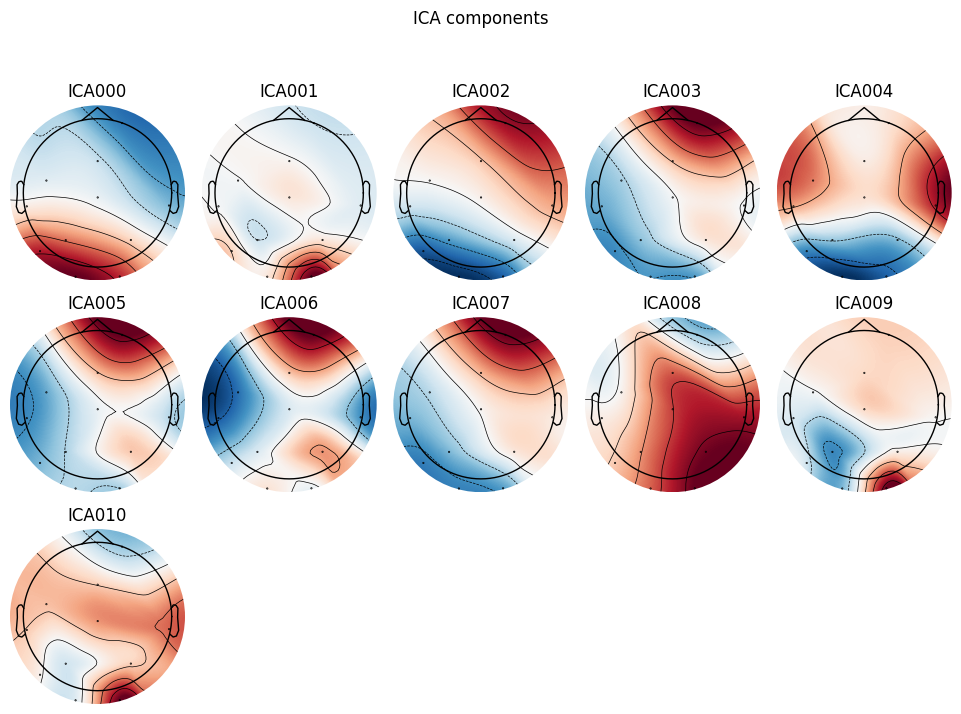

Not setting metadata
158 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 158 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  157 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~3.4 MB, data loaded,
 '1': 157>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 11 channels (please be patient, this may take a while)
Selecting by number: 11 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 0.4s.


/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: Using n_components=11 (resulting in n_components_=11) may lead to an unstable mixing matrix estimation because the ratio between the largest (4) and smallest (1.7e-15) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(data)


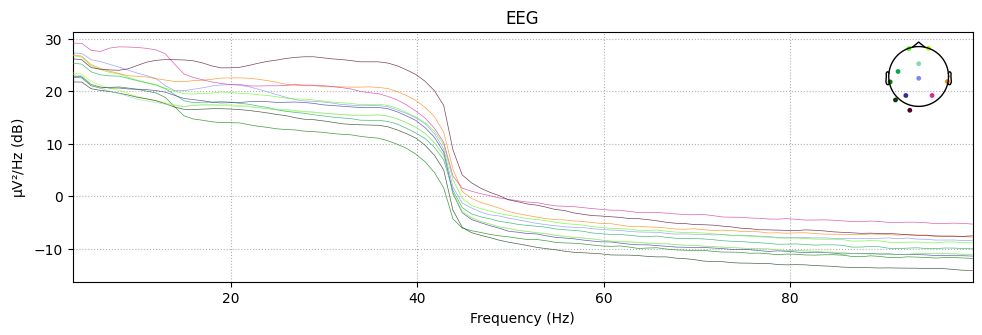

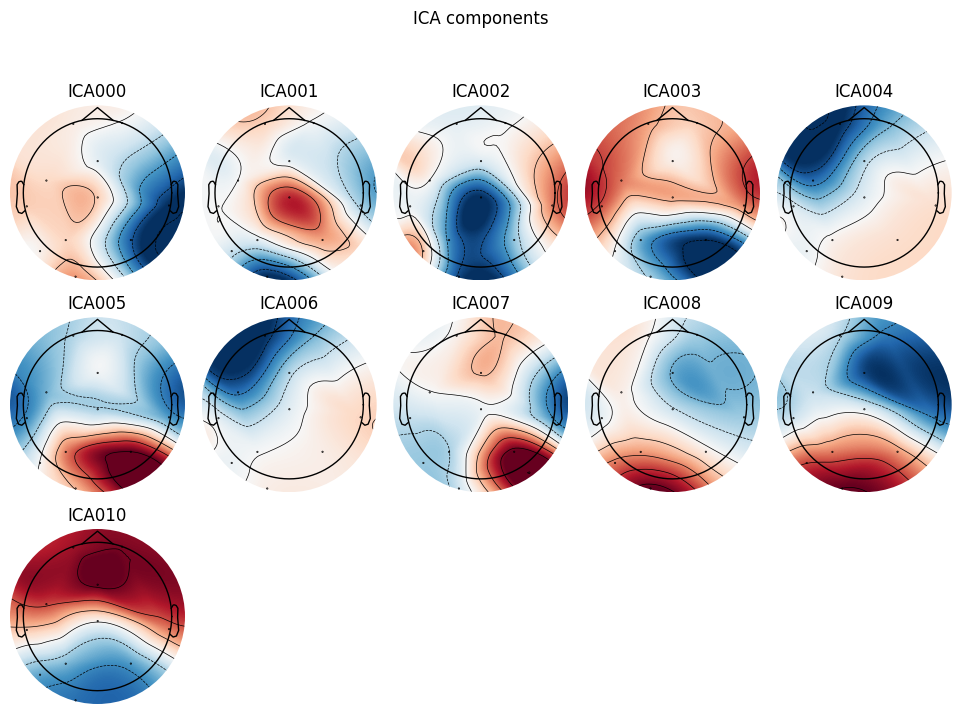

Not setting metadata
247 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 247 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  246 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~5.3 MB, data loaded,
 '1': 246>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 11 channels (please be patient, this may take a while)
Selecting by number: 11 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 1.4s.


/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: Using n_components=11 (resulting in n_components_=11) may lead to an unstable mixing matrix estimation because the ratio between the largest (8) and smallest (8.9e-16) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 5
  ica.fit(data)


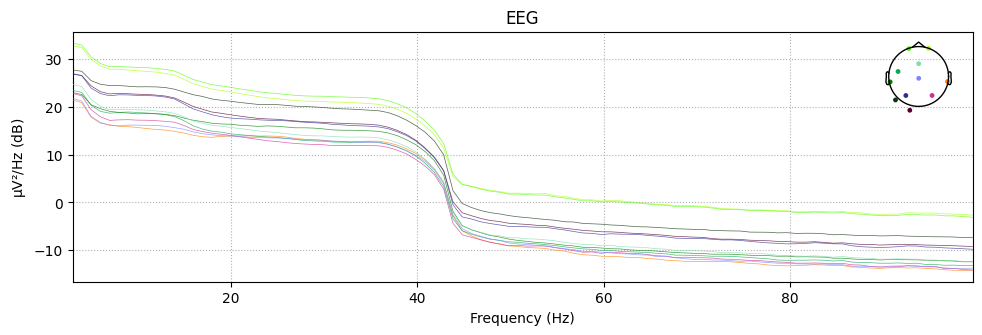

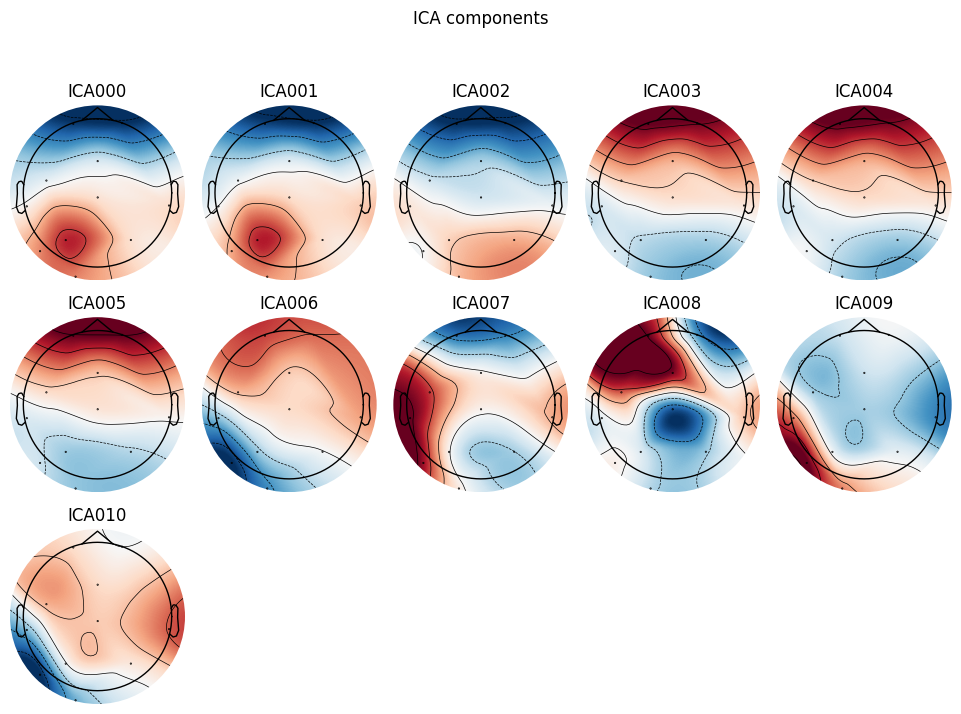

Not setting metadata
214 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 214 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  213 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~4.6 MB, data loaded,
 '1': 213>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 11 channels (please be patient, this may take a while)
Selecting by number: 11 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 0.7s.


/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: Using n_components=11 (resulting in n_components_=11) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.3) and smallest (1.9e-15) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 9
  ica.fit(data)


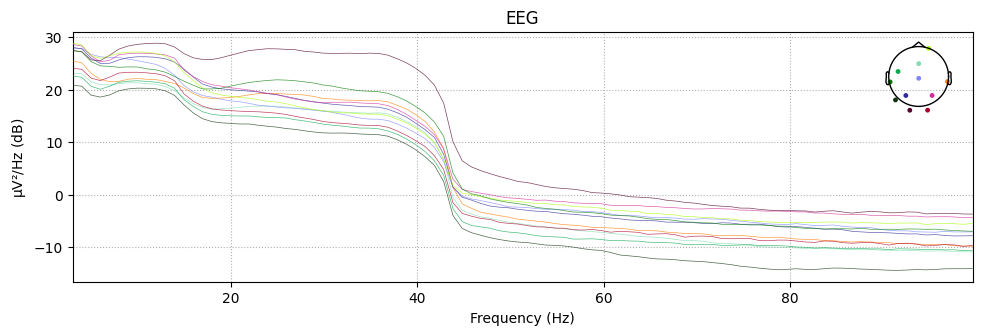

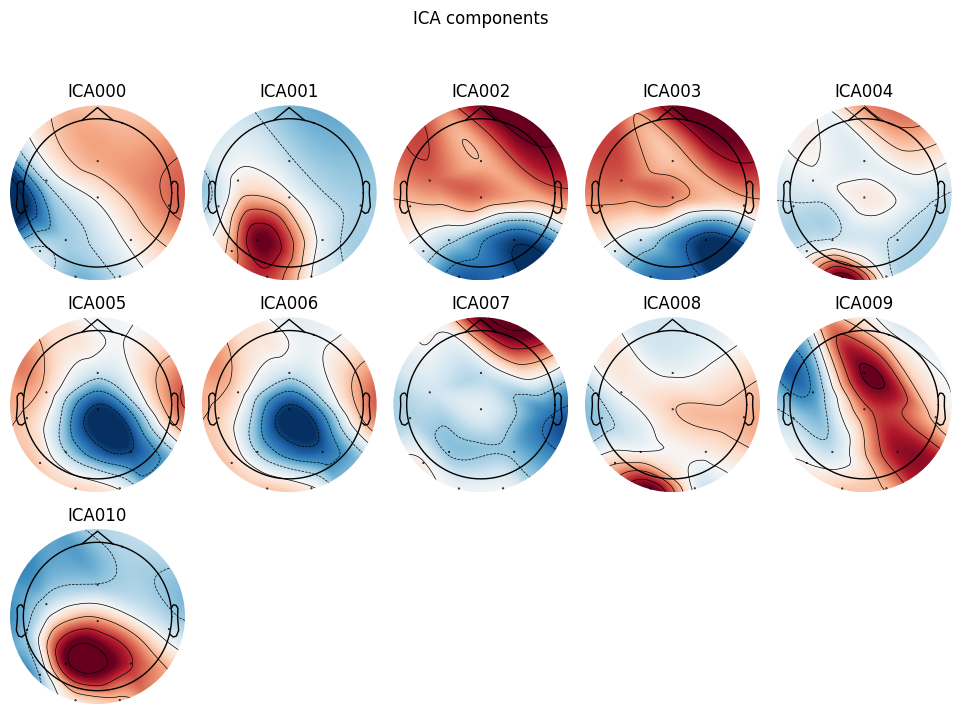

Not setting metadata
46 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 46 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  45 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~926 kB, data loaded,
 '1': 45>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 10 channels (please be patient, this may take a while)
Selecting by number: 10 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 0.7s.


/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: Using n_components=10 (resulting in n_components_=10) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.3) and smallest (1.5e-15) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(data)


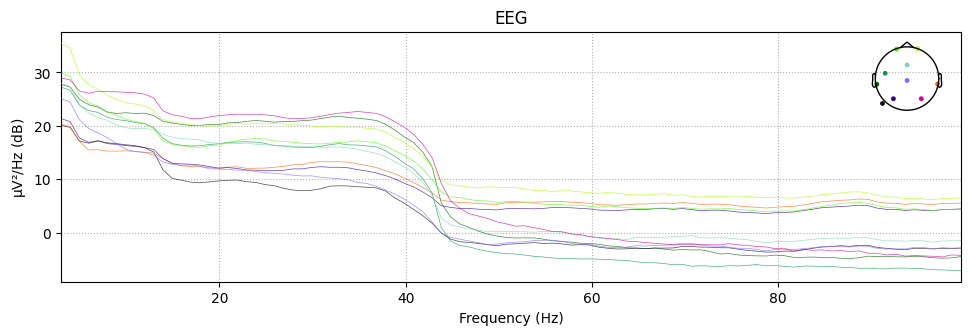

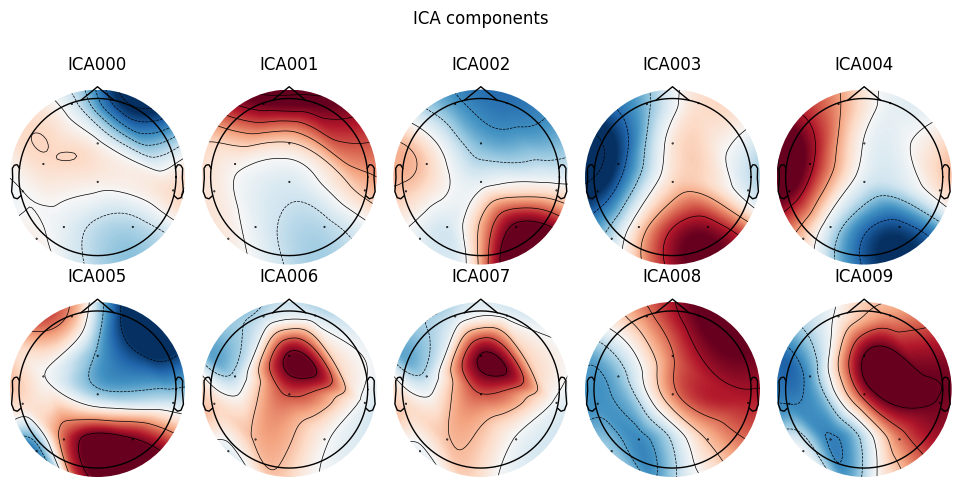

Not setting metadata
39 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 39 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  38 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~708 kB, data loaded,
 '1': 38>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 9 channels (please be patient, this may take a while)
Selecting by number: 9 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 12.6s.


/home/rucha/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:116: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


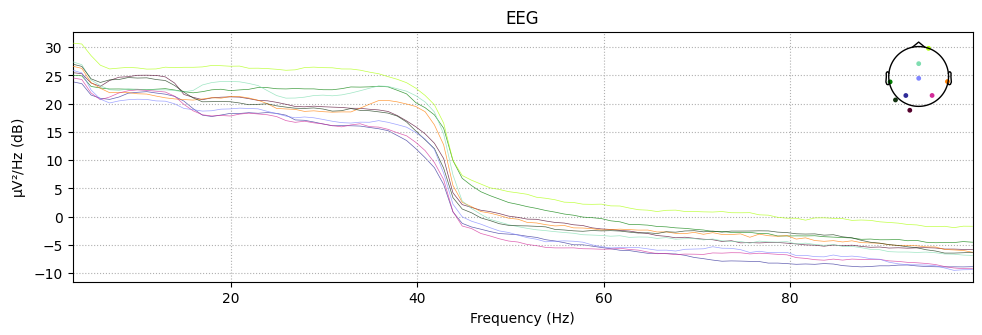

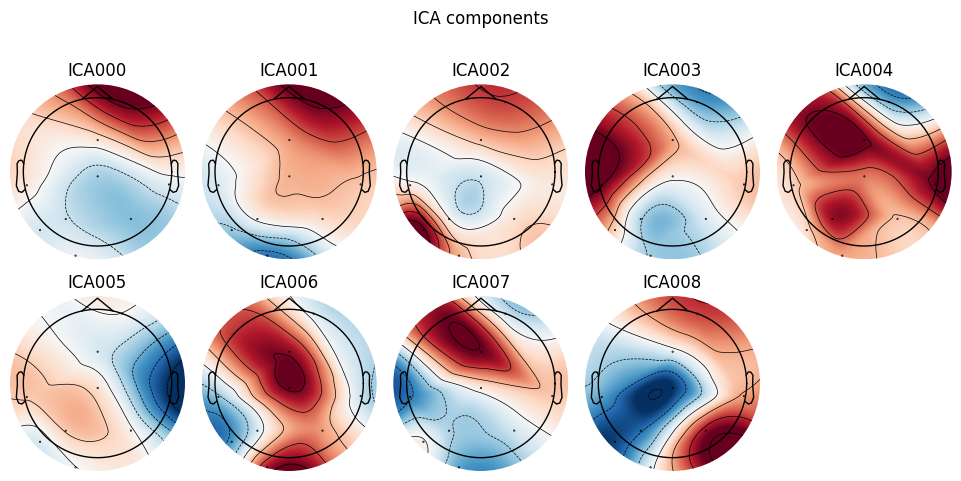

Not setting metadata
94 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 94 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  93 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~2.0 MB, data loaded,
 '1': 93>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 11 channels (please be patient, this may take a while)
Selecting by number: 11 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 0.2s.


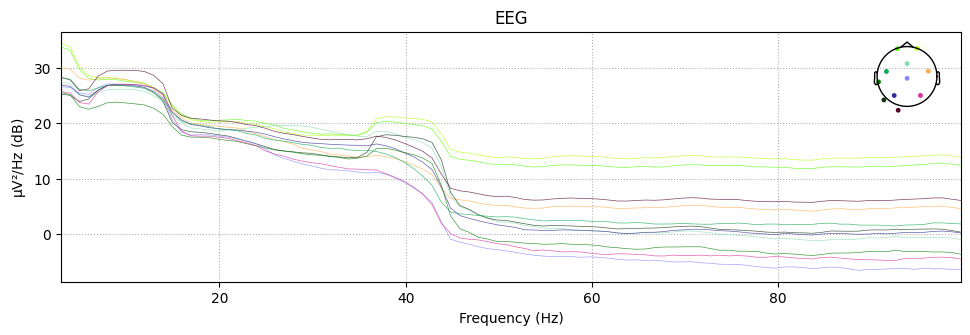

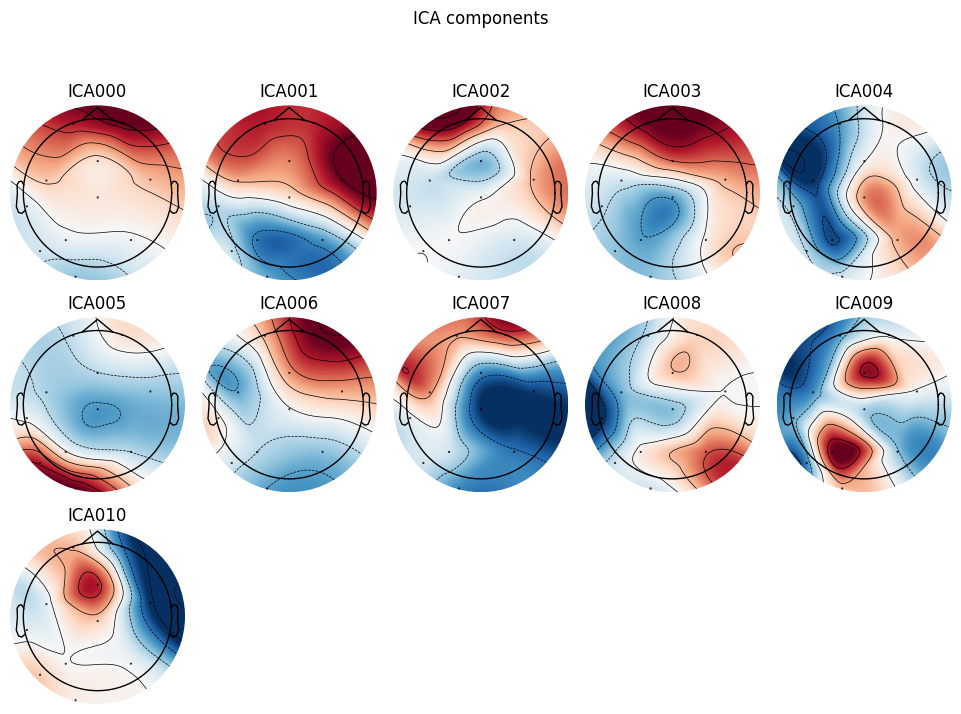

Not setting metadata
153 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 153 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  152 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~3.6 MB, data loaded,
 '1': 152>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 12 channels (please be patient, this may take a while)
Selecting by number: 12 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 0.9s.


/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (9) and smallest (4.4e-16) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 5
  ica.fit(data)


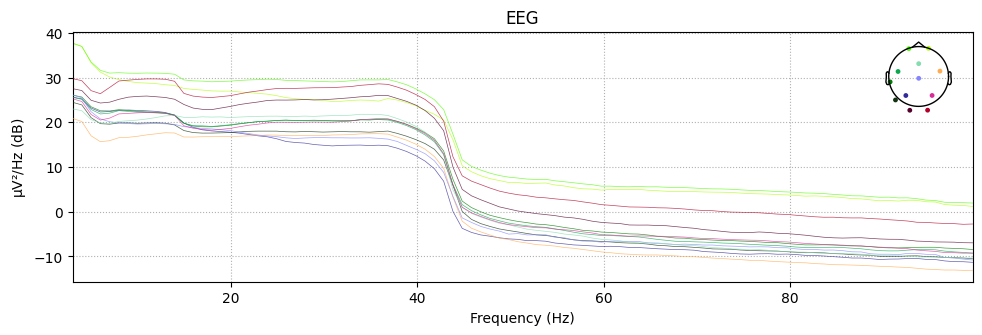

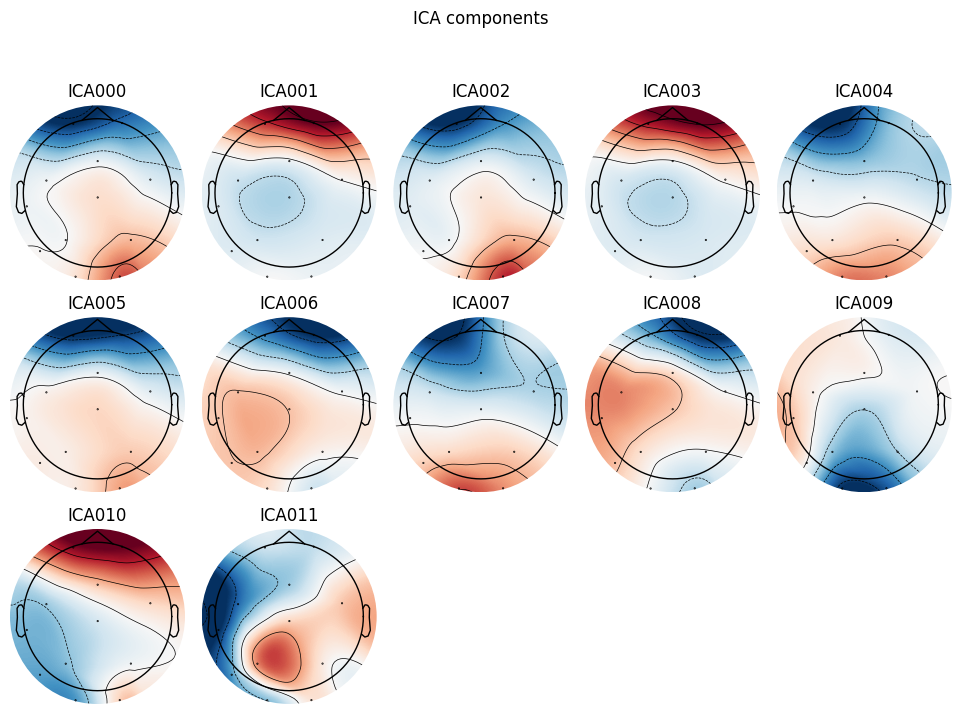

Not setting metadata
132 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 132 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  131 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~3.4 MB, data loaded,
 '1': 131>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 13 channels (please be patient, this may take a while)
Selecting by number: 13 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 3.5s.


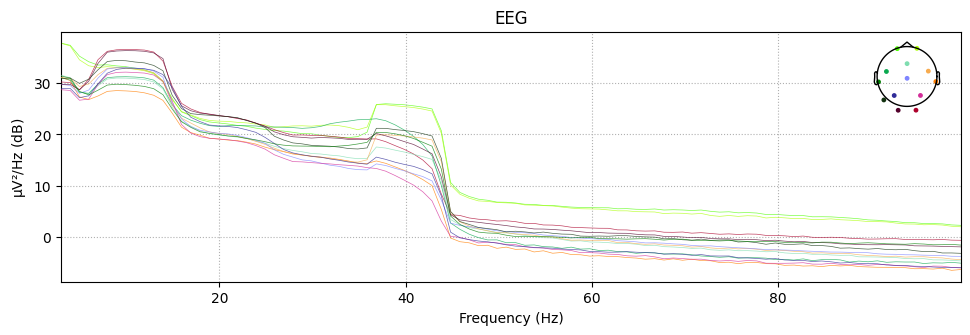

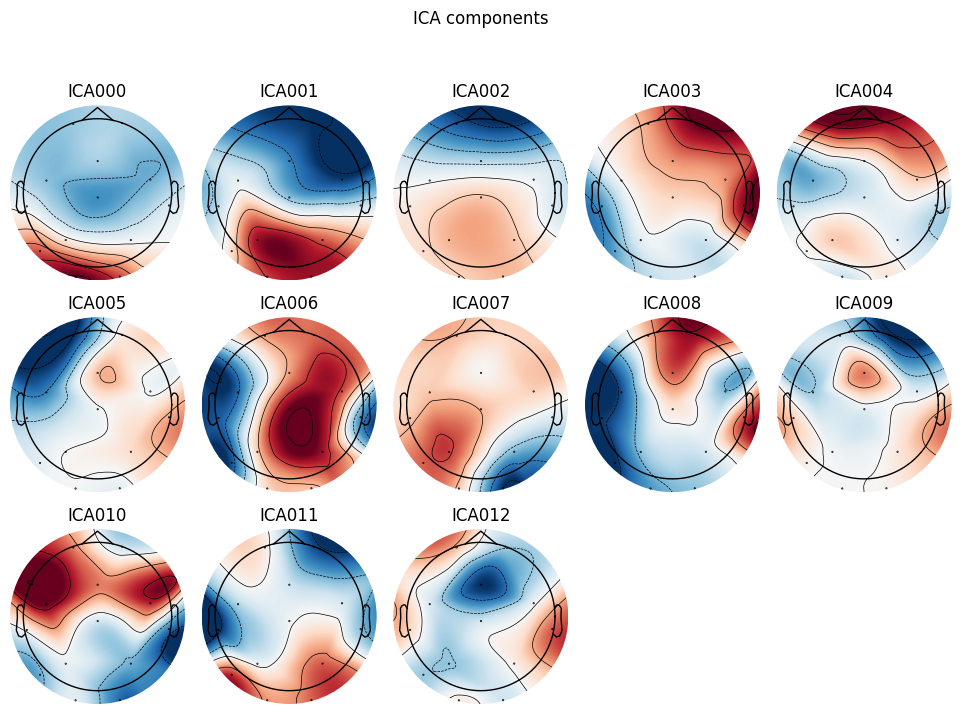

Not setting metadata
180 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 180 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  179 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~3.5 MB, data loaded,
 '1': 179>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 10 channels (please be patient, this may take a while)
Selecting by number: 10 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 0.9s.


/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: Using n_components=10 (resulting in n_components_=10) may lead to an unstable mixing matrix estimation because the ratio between the largest (8.7) and smallest (1.1e-16) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 2
  ica.fit(data)


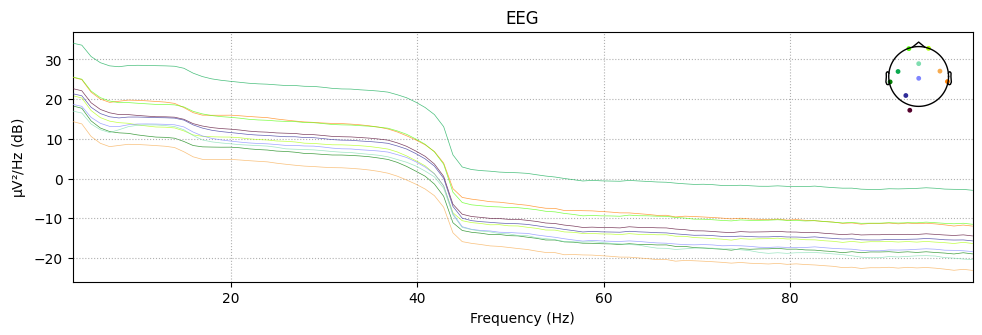

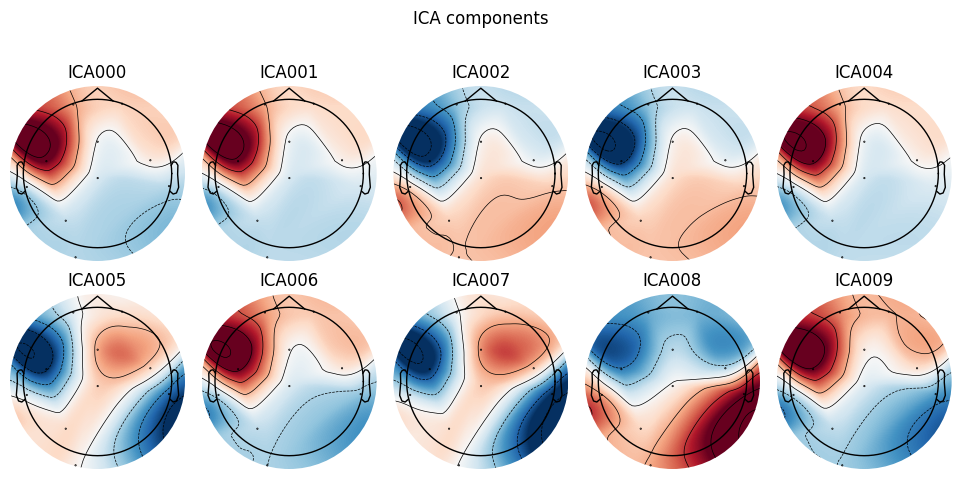

Not setting metadata
279 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 279 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  278 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~7.1 MB, data loaded,
 '1': 278>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 13 channels (please be patient, this may take a while)
Selecting by number: 13 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 29.8s.


/home/rucha/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:116: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


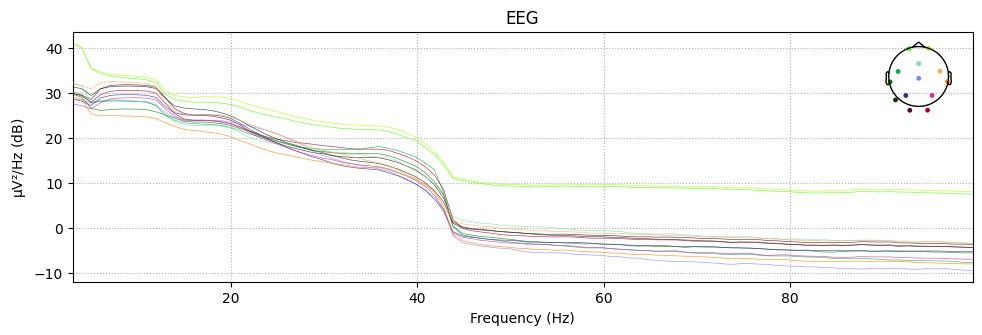

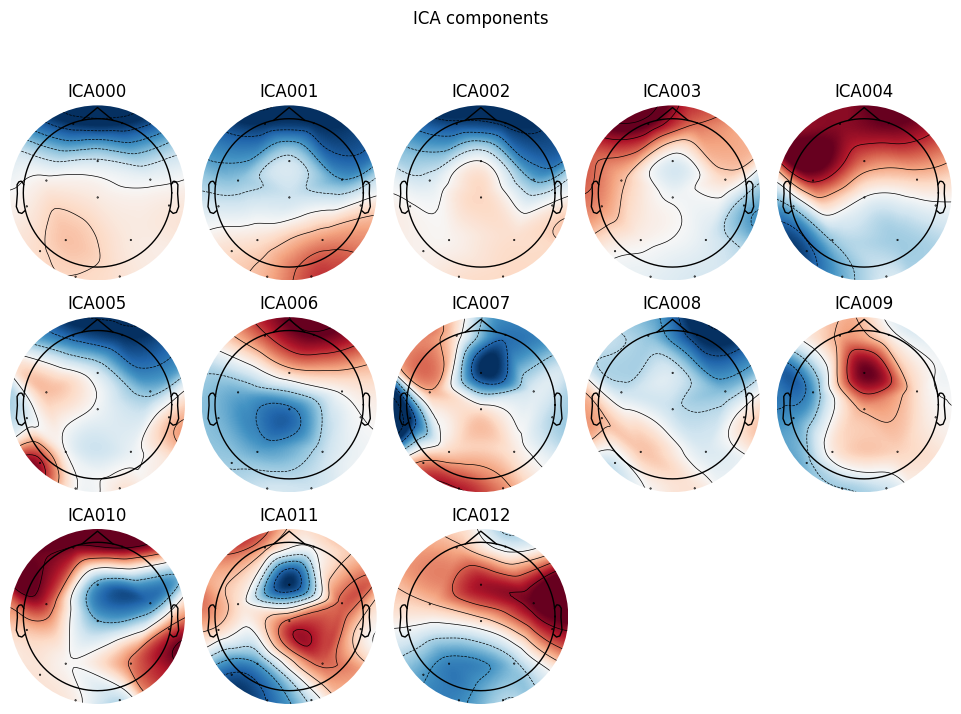

Not setting metadata
116 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 116 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  115 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~2.3 MB, data loaded,
 '1': 115>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 10 channels (please be patient, this may take a while)
Selecting by number: 10 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 0.4s.


/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: Using n_components=10 (resulting in n_components_=10) may lead to an unstable mixing matrix estimation because the ratio between the largest (7) and smallest (4.1e-16) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 5
  ica.fit(data)


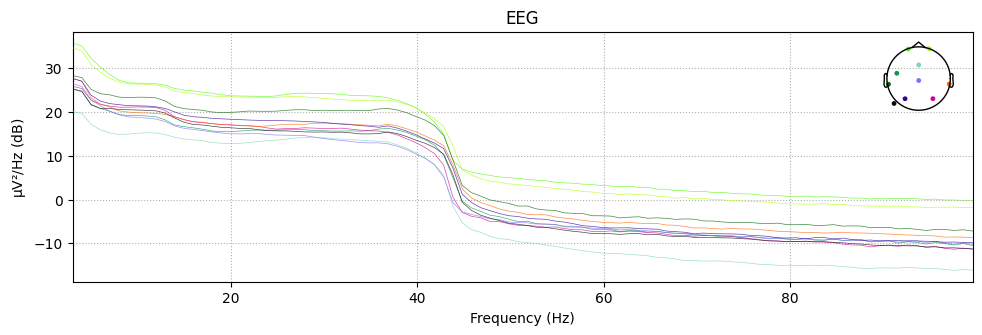

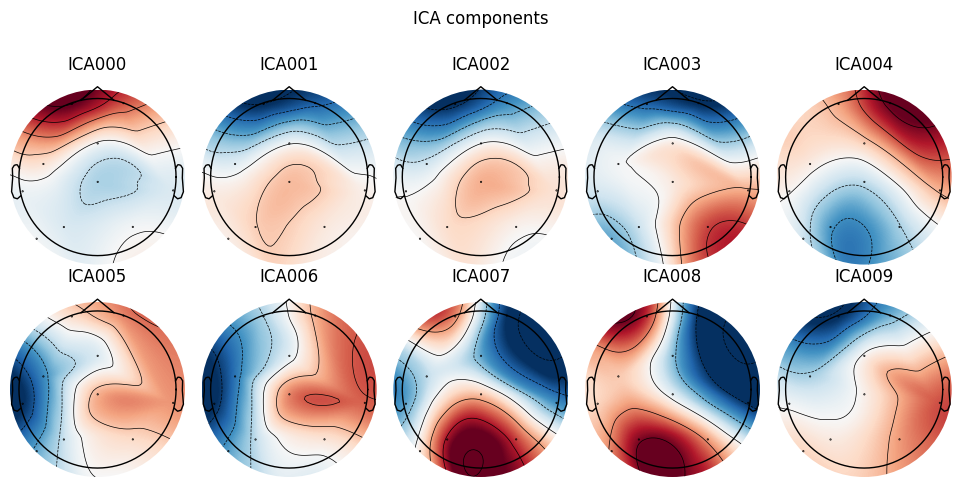

Not setting metadata
149 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 149 events and 257 original time points ...
1 bad epochs dropped
epochs <Epochs |  148 events (all good), -0.5 - 0.5 sec, baseline -0.5 – 0 sec, ~3.8 MB, data loaded,
 '1': 148>
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Fitting ICA to data using 13 channels (please be patient, this may take a while)
Selecting by number: 13 components


/home/rucha/.local/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
/tmp/ipykernel_27831/853412658.py:14: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(data)


Fitting ICA took 0.7s.


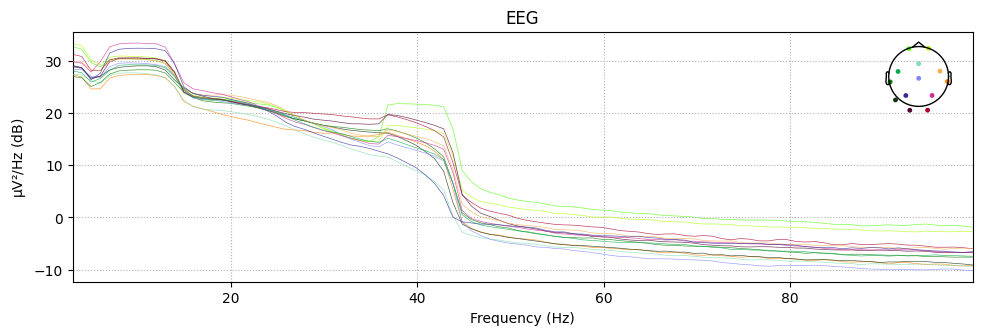

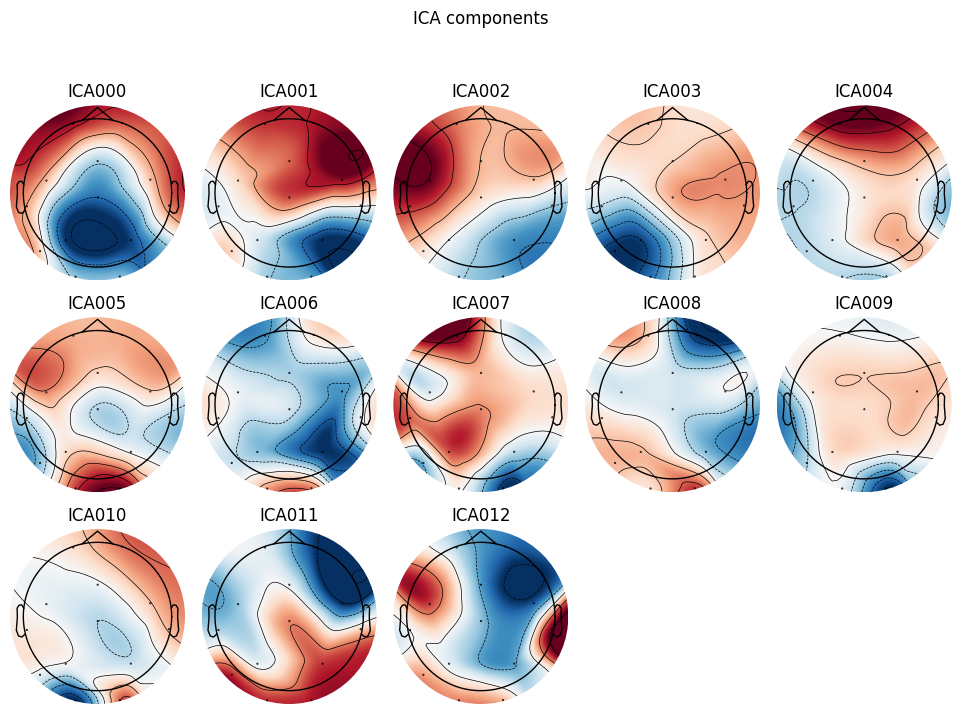

In [76]:
epochs_array = []
for data in sample_data:
  tmin, tmax = -0.5, 0.5
  events = mne.make_fixed_length_events(data, id=1, duration=0.5)
  baseline = (None, 0)
  epochs = mne.Epochs(data, events, event_id=1, tmin=tmin, tmax=tmax, baseline=baseline, preload=True)
  epochs_data = epochs.get_data()
  # epochs_array.append(epochs_data)
  epochs_array.append(epochs)
  print("epochs",epochs)
  epochs.plot_psd(fmin=2, fmax=100)
  # ica_data = data.drop_channels(["T","X","Y"])
  ica = mne.preprocessing.ICA(n_components=data.info['nchan'], random_state=0)
  ica.fit(data)
  ica.plot_components()
  # print("shape", data.info)
  # print("shape", data.info['nchan'])
  
# print(epochs_array)
# path = paths[1]

In [77]:
import numpy as np
def mean(x):
  return np.mean(x)
def median(x):
  return np.median(x)
def std(x):
  return np.std(x)
def var(x):
  return np.var(x)  
# def skewness(x):
#   return stats.skew(x)  
# def kurtosis(x):
#   return stats.kurtosis(x)
def compute_hjorth_mobility(data):
    """Hjorth mobility (per channel).
    Hjorth mobility parameter computed in the time domain.
    Parameters
    ----------
    data : ndarray, shape (n_channels, n_times)
    Returns
    -------
    output : ndarray, shape (n_channels,)
    Notes
    -----
    Alias of the feature function: **hjorth_mobility**. See [1]_.
    References
    ----------
    .. [1] Paivinen, N. et al. (2005). Epileptic seizure detection: A
           nonlinear viewpoint. Computer methods and programs in biomedicine,
           79(2), 151-159.
    """
    x = np.insert(data, 0, 0)
    dx = np.diff(x)
    sx = np.std(x, ddof=1)
    sdx = np.std(dx, ddof=1)
    mobility = np.divide(sdx, sx)
    return mobility
#Complexity
def compute_hjorth_complexity(data):
    """Hjorth complexity (per channel).
    Hjorth complexity parameter computed in the time domain.
    Parameters
    ----------
    data : ndarray, shape (n_channels, n_times)
    Returns
    -------
    output : ndarray, shape (n_channels,)
    Notes
    -----
    Alias of the feature function: **hjorth_complexity**. See [1]_.
    References
    ----------
    .. [1] Paivinen, N. et al. (2005). Epileptic seizure detection: A
           nonlinear viewpoint. Computer methods and programs in biomedicine,
           79(2), 151-159.
    """
    x = np.insert(data, 0, 0)
    dx = np.diff(x)
    m_dx = compute_hjorth_mobility(dx)
    m_x = compute_hjorth_mobility(data)
    complexity = np.divide(m_dx, m_x)
    return complexity
def shannon(x):
 y=np.power(x,2)  
 y1=np.sum(y)
 pe=y/y1
 se=np.sum(pe*np.log(np.power(pe,2)))
 return se
def logenergy(x):
  y=np.power(x,2)
  y1=np.sum(y)
  pe=y/y1
  lee=np.sum(pe*np.log(pe))
  return lee

def concatenate_features(x):
  return np.concatenate((mean(x),median(x),std(x),var(x)),axis=-1)


In [78]:
def kurtosis(a):
    b = a # Extracting the data from the 14 channels
    output = np.zeros(len(b)) # Initializing the output array with zeros (length = 14)
    k = 0; # For counting the current row no.
    for i in b:
        mean_i = np.mean(i) # Saving the mean of array i
        std_i = np.std(i) # Saving the standard deviation of array i
        t = 0.0
        for j in i:
            t += (pow((j-mean_i)/std_i,4)-3)
        kurtosis_i = t/len(i) # Formula: (1/N)*(summation(x_i-mean)/standard_deviation)^4-3
        output[k] = kurtosis_i # Saving the kurtosis in the array created
        k +=1 # Updating the current row no.
    return np.sum(output)

In [79]:
def skewness(arr):
    data = arr 
    skew_array = np.zeros(len(data)) #Initialinling the array as all 0s
    index = 0; #current cell position in the output array
   
    for i in data:
        skew_array[index]=sp.stats.skew(i,axis=0,bias=True)
        index+=1 #updating the cell position
    return np.sum(skew_array)/len(arr)

In [80]:

features=[]
for d in sample_data:
 data=d.get_data()
 features.append(mean(data))
 features.append(median(data))
 features.append(var(data))
 features.append(std(data))
 features.append(kurtosis(data))
 features.append(shannon(data))
 features.append(logenergy(data))
 features.append(compute_hjorth_mobility(data))
 features.append(compute_hjorth_complexity(data))
print(features)

[5.091070635298172e-07, 4.064674824476242e-07, 1.7575234875594145e-09, 4.192282776196537e-05, 0.17929704325274498, -22.161499632444613, -11.080749816222307, 0.1386190786486654, 6.477256833377791, 9.110307057065611e-08, 1.4703896641731263e-07, 1.4618161831493743e-10, 1.2090559057170906e-05, -0.9098770311488366, -23.735466303064786, -11.867733151532393, 0.15069475737277904, 3.5335779839088928, -2.6968638933606573e-07, -2.2672966122627258e-07, 8.997005000532105e-11, 9.485254345842342e-06, 1.3818968314412436, -21.526202668685723, -10.763101334342862, 0.2305251759612208, 3.8005829480024143, 2.9937845870472055e-09, 3.798358142375946e-08, 4.5798424498431295e-11, 6.767453324436844e-06, 14.059517031363718, -23.637519790071302, -11.818759895035651, 0.6823402580126972, 2.3546375336919985, -3.5072217467605723e-07, -3.0591224133968355e-07, 6.590125990147567e-11, 8.117959097056086e-06, 3.717434584312292, -22.74403502743766, -11.37201751371883, 0.26540489203005735, 2.8509828380974724, -4.688326092355

In [81]:

features1=[]
features2=[]
features3=[]
features4=[]
features5=[]
features6=[]
features7=[]
features8=[]
features9=[]
for d in sample_data:
 data=d.get_data()
 features1.append(mean(data))

for d in sample_data:
 data=d.get_data()
 features2.append(median(data))

for d in sample_data:
 data=d.get_data()
 features3.append(var(data))

for d in sample_data:
 data=d.get_data()
 features4.append(std(data))

for d in sample_data:
 data=d.get_data()
 features5.append(kurtosis(data))

for d in sample_data:
 data=d.get_data()
 features6.append(shannon(data))

for d in sample_data:
 data=d.get_data()
 features7.append(logenergy(data))

for d in sample_data:
 data=d.get_data()
 features8.append(compute_hjorth_mobility(data))

for d in sample_data:
 data=d.get_data()
 features9.append(compute_hjorth_complexity(data))


fd=pd.DataFrame({"mean":features1,"median":features2,"var":features3,"standard deviation":features4,"kurtosis":features5,"shannon":features6,"log energy":features7,"hjorth_mobility":features8,"hjorth_complexity":features9})
print(fd)

            mean        median           var  standard deviation   kurtosis  \
0   5.091071e-07  4.064675e-07  1.757523e-09            0.000042   0.179297   
1   9.110307e-08  1.470390e-07  1.461816e-10            0.000012  -0.909877   
2  -2.696864e-07 -2.267297e-07  8.997005e-11            0.000009   1.381897   
3   2.993785e-09  3.798358e-08  4.579842e-11            0.000007  14.059517   
4  -3.507222e-07 -3.059122e-07  6.590126e-11            0.000008   3.717435   
5  -4.688326e-07 -3.699152e-07  7.261524e-11            0.000009   6.788249   
6  -3.324831e-07 -1.835271e-07  1.226147e-10            0.000011   3.814442   
7   1.775521e-08 -6.707191e-09  5.884998e-11            0.000008  14.556521   
8  -1.167442e-07 -8.484370e-08  3.614990e-11            0.000006   2.522742   
9  -1.457028e-07 -6.788805e-08  5.854516e-11            0.000008   6.090482   
10  9.743621e-09 -2.055934e-08  4.457902e-11            0.000007   6.007078   
11 -4.858934e-07 -3.728056e-08  7.949885e-11        

In [82]:
# THETA
theta_array=[]
# for data in sample_data:
for data in epochs_array:
  epo_spectrum = data.compute_psd(method='welch', fmin=4, fmax=8,
                  picks='eeg')
  psds, freqs = epo_spectrum.get_data(return_freqs=True)
  average = np.mean(psds)
  x = len(psds)-1;
  data_power = 0;
  while(x>=0):
    channel_power = psds[x] ** 2
    data_power =data_power +  np.mean(channel_power)
    # print("channel power: ",np.mean(channel_power))
    x=x-1
  # data_power_avg = np.mean(data_power)
  # print("average power:",average)
  theta = np.sum(np.trapz(psds,freqs))
  theta_array.append(theta)
  # print("average data power Theta",theta)
  print("Theta Power:", theta)

Effective window size : 1.000 (s)
Theta Power: 1.5848927225748128e-07
Effective window size : 1.000 (s)
Theta Power: 8.513020820527173e-09
Effective window size : 1.000 (s)
Theta Power: 4.767673756660161e-09
Effective window size : 1.000 (s)
Theta Power: 1.1386178532940406e-08
Effective window size : 1.000 (s)
Theta Power: 6.472861323725806e-09
Effective window size : 1.000 (s)
Theta Power: 8.404564734797382e-09
Effective window size : 1.000 (s)
Theta Power: 1.2843393501123557e-08
Effective window size : 1.000 (s)
Theta Power: 5.852664042911659e-09
Effective window size : 1.000 (s)
Theta Power: 5.206158512600703e-09
Effective window size : 1.000 (s)
Theta Power: 8.446730348917474e-09
Effective window size : 1.000 (s)
Theta Power: 6.998745027896203e-09
Effective window size : 1.000 (s)
Theta Power: 1.0232110534652727e-09
Effective window size : 1.000 (s)
Theta Power: 9.31877590724465e-10
Effective window size : 1.000 (s)
Theta Power: 4.683618955299074e-09
Effective window size : 1.000 (

In [83]:
# BETA

beta_array=[]
# for data in sample_data:
for data in epochs_array:
  epo_spectrum = data.compute_psd(method='welch', fmin=13, fmax=30,
                  picks='eeg')
  psds, freqs = epo_spectrum.get_data(return_freqs=True)
  average = np.mean(psds)
  x = len(psds)-1;
  data_power = 0;
  while(x>=0):
    channel_power = psds[x] ** 2
    data_power =data_power +  np.mean(channel_power)
    # print("channel power: ",np.mean(channel_power))
    x=x-1
  # data_power_avg = np.mean(data_power)
  # beta = data_power_avg
  # print("average power:",average)
  beta = np.sum(np.trapz(psds,freqs))
  beta_array.append(beta)
  print("Beta power", beta)

Effective window size : 1.000 (s)
Beta power 1.0201369866047449e-07
Effective window size : 1.000 (s)
Beta power 1.1609390354153694e-08
Effective window size : 1.000 (s)
Beta power 8.351314052042818e-09
Effective window size : 1.000 (s)
Beta power 1.9135909662213393e-08
Effective window size : 1.000 (s)
Beta power 1.0107823481241446e-08
Effective window size : 1.000 (s)
Beta power 1.093424510514853e-08
Effective window size : 1.000 (s)
Beta power 1.4126388314233106e-08
Effective window size : 1.000 (s)
Beta power 1.4104665281980437e-08
Effective window size : 1.000 (s)
Beta power 1.19758089692707e-08
Effective window size : 1.000 (s)
Beta power 1.4770893105336097e-08
Effective window size : 1.000 (s)
Beta power 1.7076205956277317e-08
Effective window size : 1.000 (s)
Beta power 1.6949719765965845e-09
Effective window size : 1.000 (s)
Beta power 3.307271516118984e-09
Effective window size : 1.000 (s)
Beta power 5.149943687167884e-09
Effective window size : 1.000 (s)
Beta power 2.7089249

In [84]:
ratio_array=[]
for i in range(0,len(sample_data)):
  ratio = theta_array[i]/beta_array[i]
  ratio_array.append(ratio)
  print("theta/beta subject",i+1 ,"=",ratio)

theta/beta subject 1 = 1.5536077442400236
theta/beta subject 2 = 0.7332874992424836
theta/beta subject 3 = 0.5708890513456308
theta/beta subject 4 = 0.5950163192620026
theta/beta subject 5 = 0.6403813180689625
theta/beta subject 6 = 0.7686460888680815
theta/beta subject 7 = 0.9091774355503974
theta/beta subject 8 = 0.41494526285489325
theta/beta subject 9 = 0.4347229089875627
theta/beta subject 10 = 0.5718496700694441
theta/beta subject 11 = 0.40985363176200285
theta/beta subject 12 = 0.6036743188638595
theta/beta subject 13 = 0.2817662796001716
theta/beta subject 14 = 0.9094505182589177
theta/beta subject 15 = 0.30071383347629915
theta/beta subject 16 = 1.0710382353564953
theta/beta subject 17 = 0.559607466697247
theta/beta subject 18 = 0.7126030238064032
theta/beta subject 19 = 0.4989653290214912
theta/beta subject 20 = 0.5921979519326233


In [85]:

features=[]
for d in sample_data:
 data=d.get_data()
 features.append(mean(data))
 features.append(median(data))
 features.append(var(data))
 features.append(std(data))
 features.append(kurtosis(data))
 features.append(shannon(data))
 features.append(logenergy(data))
 features.append(compute_hjorth_mobility(data))
 features.append(compute_hjorth_complexity(data))
print(features)

[5.091070635298172e-07, 4.064674824476242e-07, 1.7575234875594145e-09, 4.192282776196537e-05, 0.17929704325274498, -22.161499632444613, -11.080749816222307, 0.1386190786486654, 6.477256833377791, 9.110307057065611e-08, 1.4703896641731263e-07, 1.4618161831493743e-10, 1.2090559057170906e-05, -0.9098770311488366, -23.735466303064786, -11.867733151532393, 0.15069475737277904, 3.5335779839088928, -2.6968638933606573e-07, -2.2672966122627258e-07, 8.997005000532105e-11, 9.485254345842342e-06, 1.3818968314412436, -21.526202668685723, -10.763101334342862, 0.2305251759612208, 3.8005829480024143, 2.9937845870472055e-09, 3.798358142375946e-08, 4.5798424498431295e-11, 6.767453324436844e-06, 14.059517031363718, -23.637519790071302, -11.818759895035651, 0.6823402580126972, 2.3546375336919985, -3.5072217467605723e-07, -3.0591224133968355e-07, 6.590125990147567e-11, 8.117959097056086e-06, 3.717434584312292, -22.74403502743766, -11.37201751371883, 0.26540489203005735, 2.8509828380974724, -4.688326092355

In [86]:
# fatigue_array=[]
# for i in ratio_array:
#   if i>0.9:
#     fatigue_array.append("FATIGUE")
#   else:
#     fatigue_array.append("NORMAL")
# print(fatigue_array)

In [87]:
fatigue_scale = [5,0,2,2,4,7,1,7,2,0,2,0,5,4,1,4,1,3,6,2]

In [88]:
fatigue_array=[]
for i in fatigue_scale:
  if i>=0 and i<3:
    fatigue_array.append("NORMAL")
  elif i>=3 and i<=5:
    fatigue_array.append("MILD FATIGUE")
  else:
    fatigue_array.append("SEVERE FATIGUE")
print(fatigue_array)

['MILD FATIGUE', 'NORMAL', 'NORMAL', 'NORMAL', 'MILD FATIGUE', 'SEVERE FATIGUE', 'NORMAL', 'SEVERE FATIGUE', 'NORMAL', 'NORMAL', 'NORMAL', 'NORMAL', 'MILD FATIGUE', 'MILD FATIGUE', 'NORMAL', 'MILD FATIGUE', 'NORMAL', 'MILD FATIGUE', 'SEVERE FATIGUE', 'NORMAL']


In [89]:

features1=[]
features2=[]
features3=[]
features4=[]
features5=[]
features6=[]
features7=[]
features8=[]
features9=[]
for d in sample_data:
 data=d.get_data()
 features1.append(mean(data))

for d in sample_data:
 data=d.get_data()
 features2.append(median(data))

for d in sample_data:
 data=d.get_data()
 features3.append(var(data))

for d in sample_data:
 data=d.get_data()
 features4.append(std(data))

for d in sample_data:
 data=d.get_data()
 features5.append(kurtosis(data))

for d in sample_data:
 data=d.get_data()
 features6.append(shannon(data))

for d in sample_data:
 data=d.get_data()
 features7.append(logenergy(data))

for d in sample_data:
 data=d.get_data()
 features8.append(compute_hjorth_mobility(data))

for d in sample_data:
 data=d.get_data()
 features9.append(compute_hjorth_complexity(data))


fd=pd.DataFrame({"mean":features1,"median":features2,"var":features3,"standard deviation":features4,"kurtosis":features5,"shannon":features6,"log energy":features7,"hjorth_mobility":features8,"hjorth_complexity":features9,"Theta":theta_array,"Beta":beta_array,"scale":fatigue_scale,"Result":fatigue_array})
print(fd)

            mean        median           var  standard deviation   kurtosis  \
0   5.091071e-07  4.064675e-07  1.757523e-09            0.000042   0.179297   
1   9.110307e-08  1.470390e-07  1.461816e-10            0.000012  -0.909877   
2  -2.696864e-07 -2.267297e-07  8.997005e-11            0.000009   1.381897   
3   2.993785e-09  3.798358e-08  4.579842e-11            0.000007  14.059517   
4  -3.507222e-07 -3.059122e-07  6.590126e-11            0.000008   3.717435   
5  -4.688326e-07 -3.699152e-07  7.261524e-11            0.000009   6.788249   
6  -3.324831e-07 -1.835271e-07  1.226147e-10            0.000011   3.814442   
7   1.775521e-08 -6.707191e-09  5.884998e-11            0.000008  14.556521   
8  -1.167442e-07 -8.484370e-08  3.614990e-11            0.000006   2.522742   
9  -1.457028e-07 -6.788805e-08  5.854516e-11            0.000008   6.090482   
10  9.743621e-09 -2.055934e-08  4.457902e-11            0.000007   6.007078   
11 -4.858934e-07 -3.728056e-08  7.949885e-11        

In [90]:
fd1=pd.DataFrame(columns=["Mean","Median","Variance","Standard Deviation","Shannon Entropy","Kurtosis","Log Energy","Hjroth Mobility","Hjroth Complexity","Theta","Beta","Scale","Results"])

fd1["Mean"]=features1
fd1["Median"]=features2
fd1["Variance"]=features3
fd1["Standard Deviation"]=features4
fd1["Kurtosis"]=features5
fd1["Shannon Entropy"]=features6
fd1["Log Energy"]=features7
fd1["Hjroth Mobility"]=features8
fd1["Hjroth Complexity"]=features9
fd1["Theta"]=theta_array
fd1["Beta"]=beta_array
fd1["Scale"]=fatigue_scale
# fd1["Ratio"]=ratio_array
fd1["Results"]=fatigue_array

In [91]:
fd1

,Mean,Median,Variance,Standard Deviation,Shannon Entropy,Kurtosis,Log Energy,Hjroth Mobility,Hjroth Complexity,Theta,Beta,Scale,Results
0,5.091071e-07,4.064675e-07,1.757523e-09,0.000042,-22.161500,0.179297,-11.080750,0.138619,6.477257,1.584893e-07,1.020137e-07,5,MILD FATIGUE
1,9.110307e-08,1.470390e-07,1.461816e-10,0.000012,-23.735466,-0.909877,-11.867733,0.150695,3.533578,8.513021e-09,1.160939e-08,0,NORMAL
2,-2.696864e-07,-2.267297e-07,8.997005e-11,0.000009,-21.526203,1.381897,-10.763101,0.230525,3.800583,4.767674e-09,8.351314e-09,2,NORMAL
3,2.993785e-09,3.798358e-08,4.579842e-11,0.000007,-23.637520,14.059517,-11.818760,0.682340,2.354638,1.138618e-08,1.913591e-08,2,NORMAL
4,-3.507222e-07,-3.059122e-07,6.590126e-11,0.000008,-22.744035,3.717435,-11.372018,0.265405,2.850983,6.472861e-09,1.010782e-08,4,MILD FATIGUE
5,-4.688326e-07,-3.699152e-07,7.261524e-11,0.000009,-21.666409,6.788249,-10.833205,0.257184,3.312858,8.404565e-09,1.093425e-08,7,SEVERE FATIGUE
6,-3.324831e-07,-1.835271e-07,1.226147e-10,0.000011,-22.533313,3.814442,-11.266657,0.281721,3.143769,1.284339e-08,1.412639e-08,1,NORMAL
7,1.775521e-08,-6.707191e-09,5.884998e-11,0.000008,-22.979660,14.556521,-11.489830,0.253245,2.851501,5.852664e-09,1.410467e-08,7,SEVERE FATIGUE
8,-1.167442e-07,-8.484370e-08,3.614990e-11,0.000006,-22.755399,2.522742,-11.377700,0.357259,2.095523,5.206159e-09,1.197581e-08,2,NORMAL
9,-1.457028e-07,-6.788805e-08,5.854516e-11,0.000008,-23.088572,6.090482,-11.544286,0.236043,3.182018,8.446730e-09,1.477089e-08,0,NORMAL


In [92]:
# Load .set file
# path="/content/drive/MyDrive/preprocessed/sub0.set"
# raw = mne.io.read_raw_eeglab(path)

# raw.plot()
# raw.compute_psd().plot()

In [93]:
# # Functional Connectivity
# count=0;
# for data in sample_data:
#   count=count+1
#   epo_spectrum = data.compute_psd(method='welch', fmin=4, fmax=8,
#                   picks='eeg')
#   psds, freqs = epo_spectrum.get_data(return_freqs=True)
#   corr = np.corrcoef(psds)
#   #topographs
#   # channels_to_drop = ["T","X","Y"]
#   # cdata = data
#   # connectivity = corr.mean(axis=1)
#   # mne.viz.plot_topomap(connectivity, cdata.info, cmap="RdBu_r")

#   # print(corr)
#   sns.heatmap(corr, cmap="RdBu_r", vmin=-1,vmax=1)
#   plt.title(f"Functional Connectivity Subject %d"% count)
#   plt.xlabel("Channels")
#   plt.ylabel("Channels")
#   plt.show()

In [94]:
x = fd1.iloc[:, [0,1,2,3,4,5,6,7,8]].values
y = fd1.iloc[:,12].values
# print("X",x)
# print("Y",y)

In [95]:
#Logistic Regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3)
classifier = LogisticRegression(random_state = 0)
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)
# print (xtrain[0:10, :])
print ("Accuracy : ", accuracy_score(y_test, y_pred))
scores = cross_val_score(classifier, x, y, cv=5)
print("Accuracy for each fold: ", scores)
print("Average accuracy:", np.mean(scores)*100,"%")
#Train and test accuracy to be calculated
#Cross validation


Accuracy :  0.5
Accuracy for each fold:  [0.5  0.5  0.75 0.25 0.75]
Average accuracy: 55.00000000000001 %


/home/rucha/.local/lib/python3.10/site-packages/sklearn/model_selection/_split.py:676: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/home/rucha/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/rucha/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scik

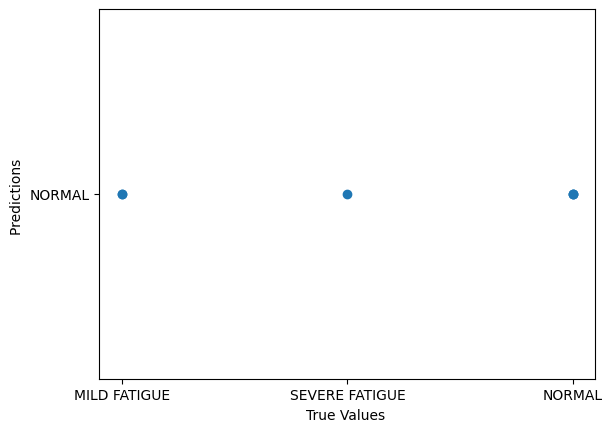

In [96]:
#Plotting y_test(True value) and y_pred(Predicted Value)
plt.scatter(y_test,y_pred)
plt.xlabel('True Values ')
plt.ylabel('Predictions ')
plt.show()

In [97]:
#Calculating R Square
# from sklearn.metrics import r2_score
# score=r2_score(y_test,y_pred)
# score

In [98]:
taken=fd1.iloc[:, [0,1,2,3,4,5,6,7,8]].values
# sub1.reshape(1,-1).shape
sub1=taken[0].reshape(1,-1)

In [99]:
classifier.predict(taken[7].reshape(1,-1))

array(['MILD FATIGUE'], dtype=object)

In [100]:
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error


/home/rucha/.local/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/home/rucha/.local/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Se

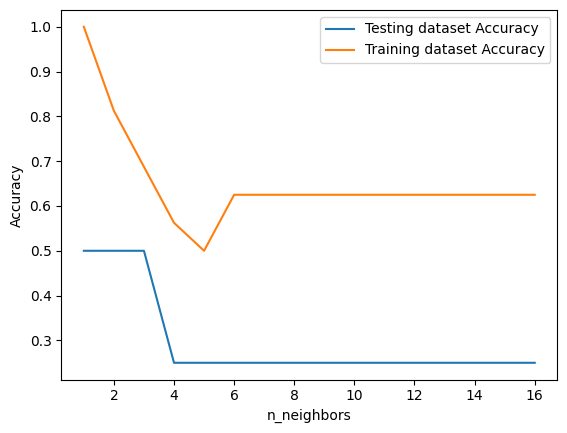

In [101]:
# K-Nearest Neighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt

X_train, X_test, y_train, y_test = train_test_split(
             x, y, test_size = 0.2)
  
neighbors = np.arange(1, 17)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

for i, k in enumerate(neighbors):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    train_accuracy[i] = knn.score(X_train, y_train)
    test_accuracy[i] = knn.score(X_test, y_test)
    # scores = cross_val_score(knn, x, y, cv=5)
    # print("Accuracy for each fold: ", scores)
    # print("Average accuracy: ", np.mean(scores))
  
plt.plot(neighbors, test_accuracy, label = 'Testing dataset Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training dataset Accuracy')
  
plt.legend()
plt.xlabel('n_neighbors')
plt.ylabel('Accuracy')
plt.show()

Accuracy for each fold:  [0.5  0.   0.25 0.   0.25]
Average accuracy: 20.0 %


/home/rucha/.local/lib/python3.10/site-packages/sklearn/model_selection/_split.py:676: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


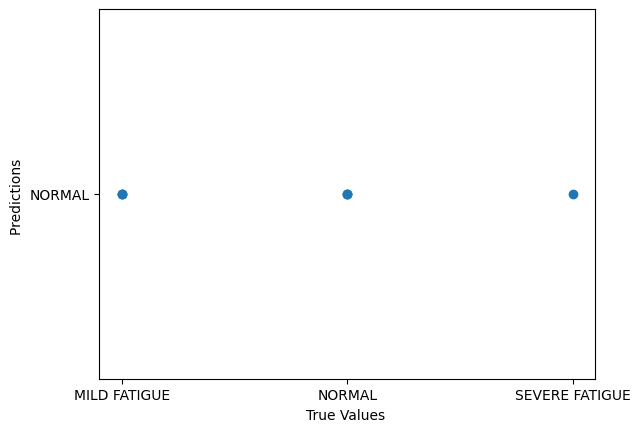

In [102]:
#Decision Tree
dtdata=fd1[["Shannon Entropy","Kurtosis","Log Energy","Hjroth Mobility","Hjroth Complexity"]]
dtdata
from sklearn.tree import DecisionTreeClassifier
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.35)
dtc=DecisionTreeClassifier()
dtc=dtc.fit(x_train,y_train)
result=dtc.predict(x_test)
# dtc.score(x_test,y_test)
acc = accuracy_score(y_test,result)
acc
scores = cross_val_score(dtc, x, y, cv=5)
print("Accuracy for each fold: ", scores)
print("Average accuracy:", np.mean(scores)*100,"%")
predictResult=dtc.predict(x_test)
predictResult
plt.scatter(y_test,predictResult)
plt.xlabel('True Values ')
plt.ylabel('Predictions ')
plt.show()

In [103]:
#Random Forest
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
dtdata=fd1[["Shannon Entropy","Kurtosis","Log Energy","Hjroth Mobility","Hjroth Complexity"]]
dtdata
from sklearn.tree import DecisionTreeClassifier
X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.35)
clf = RandomForestClassifier(n_estimators = 100) 
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
from sklearn import metrics  
print()
# print("ACCURACY OF THE MODEL: ", metrics.accuracy_score(y_test, y_pred))
scores = cross_val_score(clf, x, y, cv=5)
print("Accuracy for each fold: ", scores)
print("Average accuracy:", np.mean(scores)*100,"%")

/home/rucha/.local/lib/python3.10/site-packages/sklearn/model_selection/_split.py:676: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


Accuracy for each fold:  [0.5  0.5  0.5  0.25 0.5 ]
Average accuracy: 45.0 %


Subject 1


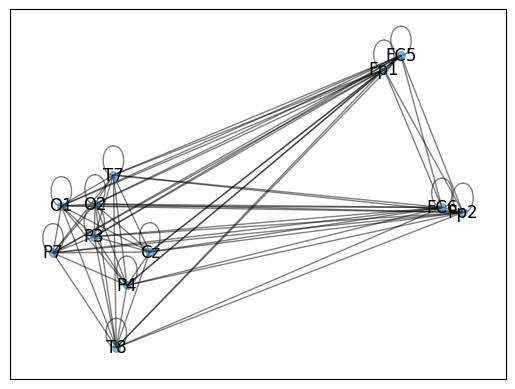

Subject 2


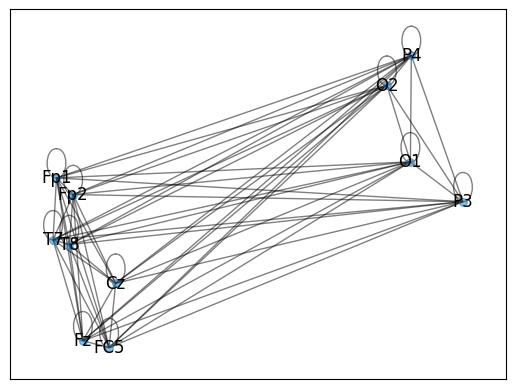

Subject 3


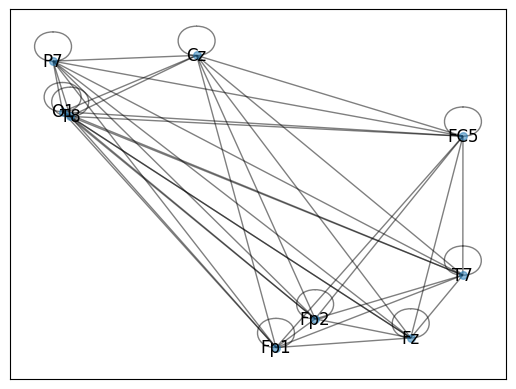

Subject 4


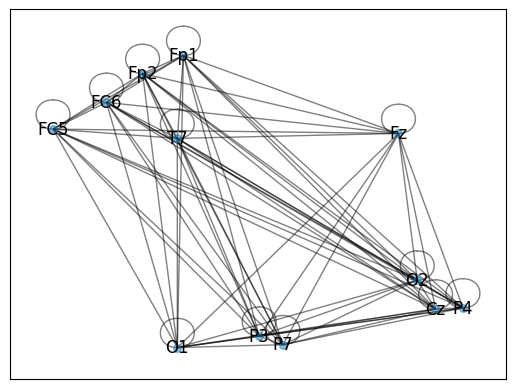

Subject 5


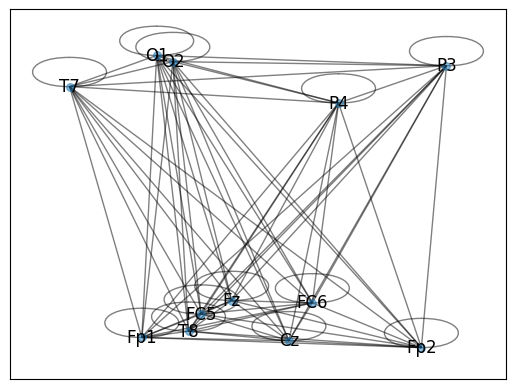

Subject 6


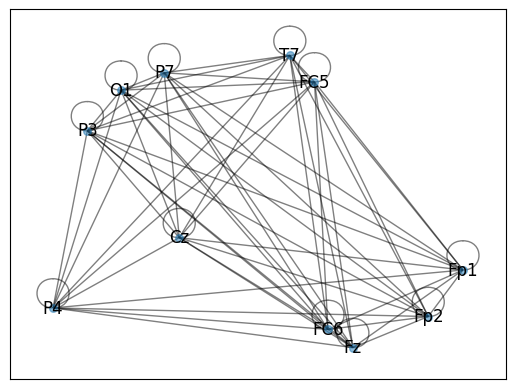

Subject 7


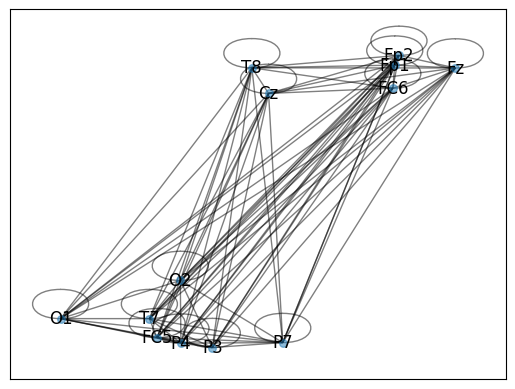

Subject 8


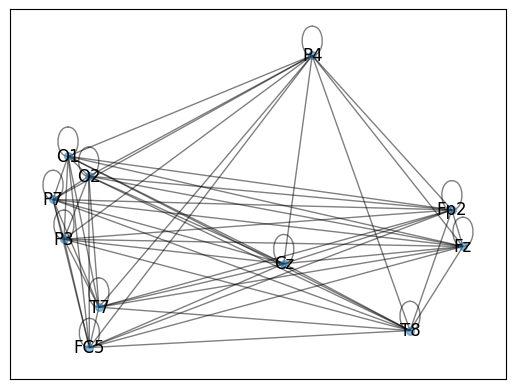

Subject 9


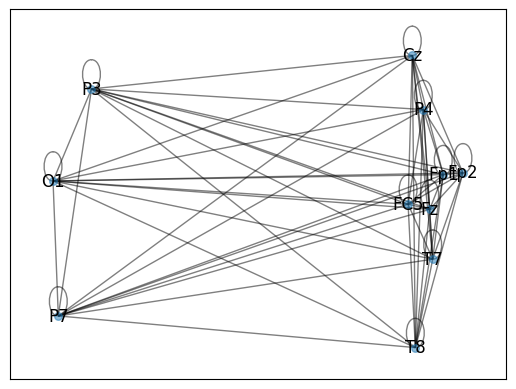

Subject 10


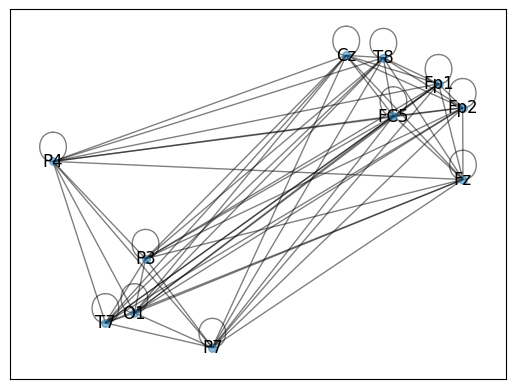

Subject 11


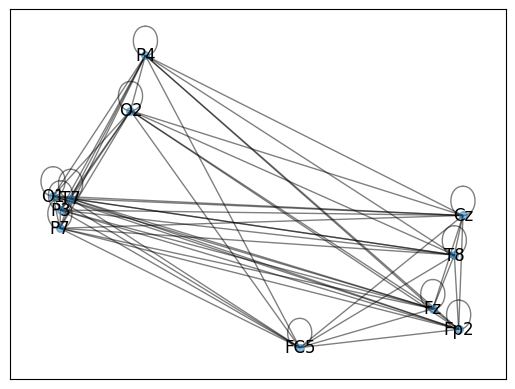

Subject 12


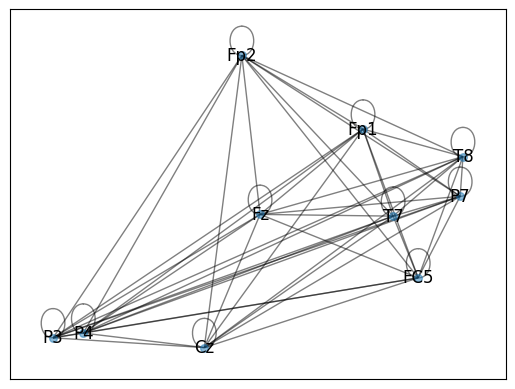

Subject 13


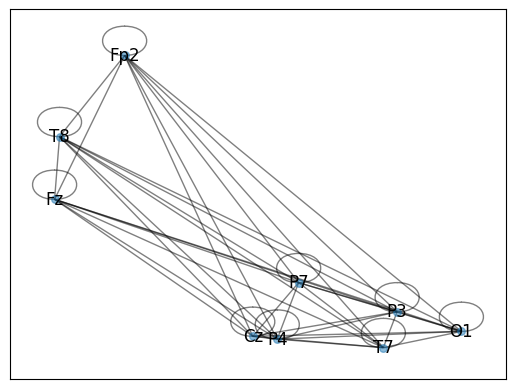

Subject 14


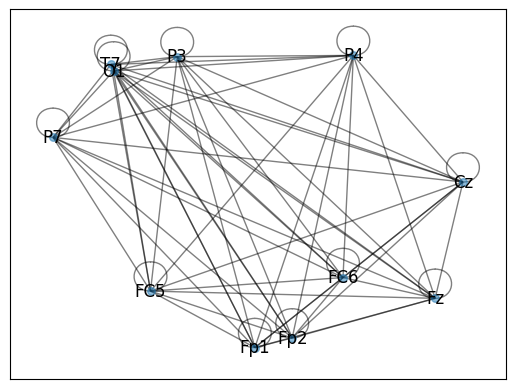

Subject 15


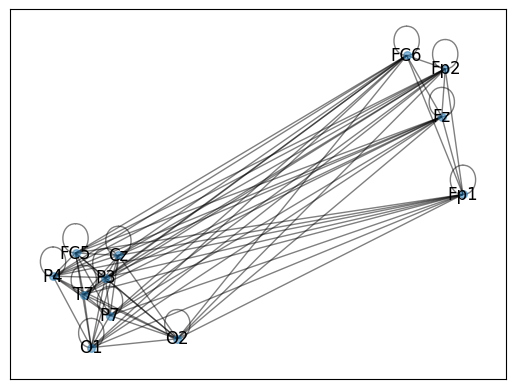

Subject 16


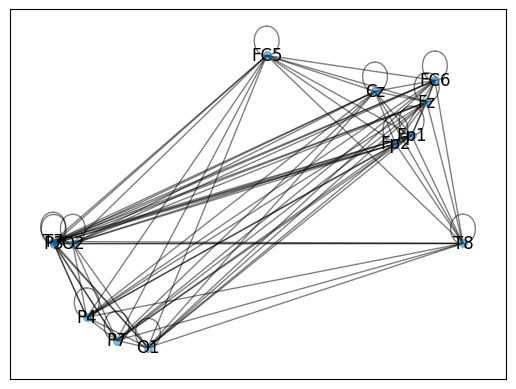

Subject 17


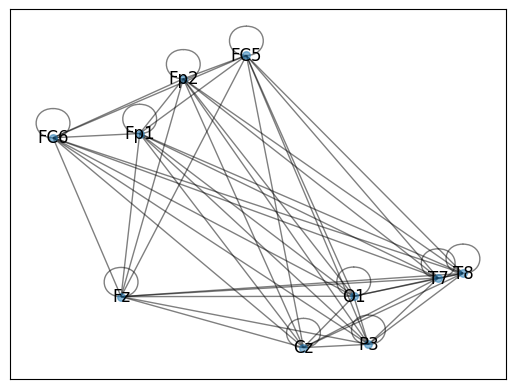

Subject 18


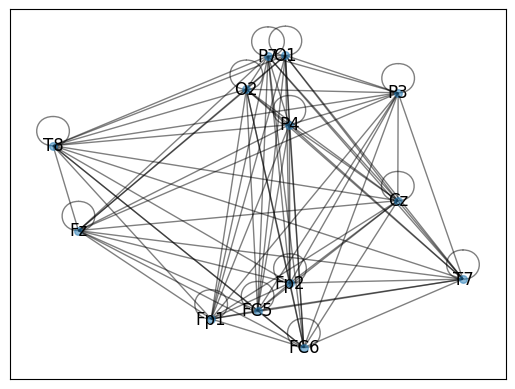

Subject 19


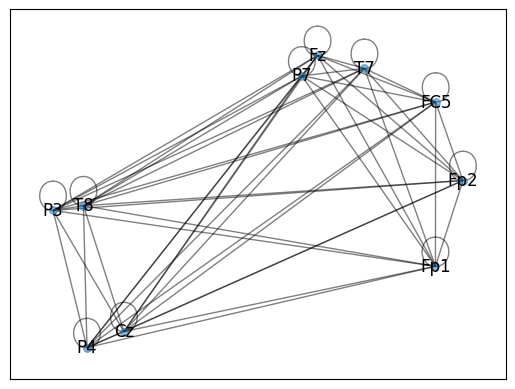

Subject 20


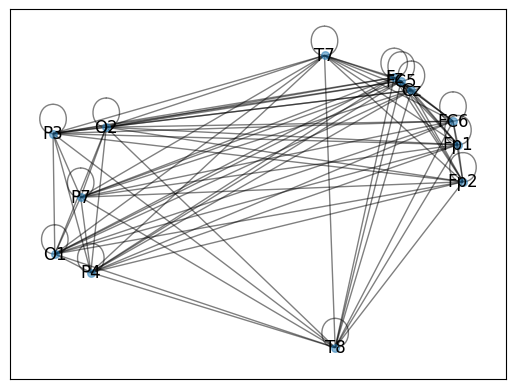

In [104]:
# Functional Connectivity
count=0
for raw in sample_data:
  # Extract signals
  data = raw.get_data()
  
  # Calculate functional connectivity
  corr = np.corrcoef(data)

  # Create graph from functional connectivity matrix
  G = nx.Graph(corr)

  # Plot graph
  pos = nx.spring_layout(G)
  nx.draw_networkx(G, pos, with_labels=False, node_size=30, alpha=0.5)

  # getting channel names
  channel_names = raw.info['ch_names']

  # Adding channel names
  count=count+1
  print("Subject",count)
  labels = dict(zip(range(len(channel_names)), channel_names))
  nx.draw_networkx_labels(G, pos, labels, font_size=12)

  plt.show()

    Using multitaper spectrum estimation with 7 DPSS windows


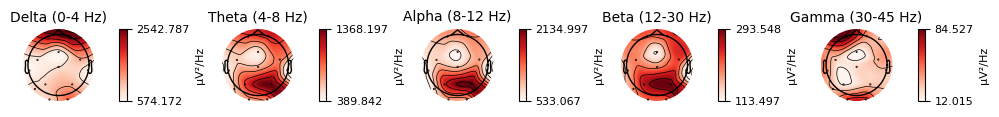

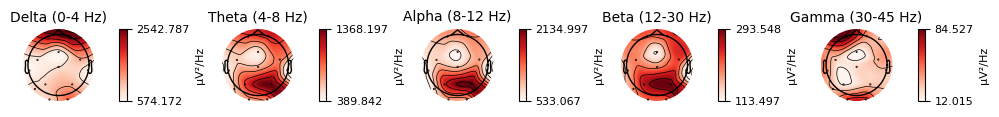

In [105]:
epochs.compute_psd().plot_topomap()

In [106]:
import scipy.io
import numpy as np
from scipy.signal import hilbert
plv=[]
for file in sample_data:
  mat_data=file.get_data()
  signal1 = np.squeeze(mat_data[0])
  signal2 = np.squeeze(mat_data[1])

  # Compute the analytic signals of the two signals using the Hilbert transform
  analytic_signal1 = hilbert(signal1)
  analytic_signal2 = hilbert(signal2)

  # Compute the phases of the analytic signals
  phase1 = np.angle(analytic_signal1)
  phase2 = np.angle(analytic_signal2)

  # Compute the phase differences between the two signals
  phase_diff = phase1 - phase2

  # Compute the PLV using the absolute value of the average of the complex exponential
  plv_value = np.abs(np.mean(np.exp(1j * phase_diff)))
  plv.append(plv_value)
  # print('Phase locking value: {:.3f}'.format(plv_value))
print(plv)


[0.8890364582958268, 0.7574817716922676, 0.8381807721956914, 0.8776708015096999, 0.7327103001195734, 0.9508340687350796, 0.8282292411221278, 0.39661289805445415, 0.6906519650444491, 0.8537049338509886, 0.2598117815721402, 0.5582393639873121, 0.14980860545002397, 0.6647736601314049, 0.8176648239151056, 0.5319775686278032, 0.8821310605029168, 0.8769892400670016, 0.7107353265485193, 0.5316211519323351]


In [107]:
import numpy as np
from scipy import signal
count=0
for file in sample_data:
  mat_data=file.get_data()
  signal1 = np.squeeze(mat_data[0])
  signal2 = np.squeeze(mat_data[1])
  # Generate two random time series with 100 data points
  count=count+1
  # Compute coherence between the two time series in the frequency range [0.5, 30] Hz
  f, coh = signal.coherence(signal1, signal2, fs=1.0, nperseg=50, nfft=100, detrend=False, window='hanning')
  print("Subject",count)
  # Plot the coherence spectrum
  import matplotlib.pyplot as plt
  plt.plot(f, coh)
  plt.xlabel('Frequency (Hz)')
  plt.ylabel('Coherence')
  plt.show()


ValueError: Unknown window type.

In [ ]:
import gzip, pickle
import sklearn

In [ ]:
pickle.dump(classifier,open('regmodel.pkl','wb'))

In [ ]:
pickled_model=pickle.load(open('regmodel.pkl','rb'))